In [35]:
## load useful libraries
suppressWarnings(suppressPackageStartupMessages(library(rhdf5)))
suppressWarnings(suppressPackageStartupMessages(library(qvalue)))
suppressWarnings(suppressPackageStartupMessages(library(dplyr)))
suppressWarnings(suppressPackageStartupMessages(library(tidyverse)))
suppressWarnings(suppressPackageStartupMessages(library(ggbeeswarm)))
suppressWarnings(suppressPackageStartupMessages(library(ggthemes)))
suppressWarnings(suppressPackageStartupMessages(library(scater)))
suppressWarnings(suppressPackageStartupMessages(library(SingleCellExperiment)))
suppressWarnings(suppressPackageStartupMessages(library(edgeR)))
# suppressWarnings(suppressPackageStartupMessages(library(scQTLs)))
suppressWarnings(suppressPackageStartupMessages(library(limma)))

In [2]:
#### old sce

In [3]:
#oldsce = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180310/sce_merged_qc_filt_mnn_correct_slalom.rds")

In [4]:
#oldsce

In [2]:
pluri_markers <- c("ENSG00000111704_NANOG", "ENSG00000204531_POU5F1",
                   "ENSG00000164362_TERT", "ENSG00000181449_SOX2",
                   "ENSG00000121570_DPPA4")
pluri_markers_select <- c("ENSG00000111704_NANOG", "ENSG00000204531_POU5F1",
                          "ENSG00000181449_SOX2")
mesendo_markers <- c("ENSG00000164458_T", "ENSG00000163508_EOMES",
                     "ENSG00000185155_MIXL1")
defendo_markers <- c("ENSG00000121966_CXCR4", "ENSG00000136574_GATA4",
                     "ENSG00000141448_GATA6", "ENSG00000125798_FOXA2",
                     "ENSG00000164736_SOX17", "ENSG00000133937_GSC",
                     "ENSG00000147869_CER1", "ENSG00000132130_LHX1")
defendo_markers_select <- c("ENSG00000121966_CXCR4", "ENSG00000136574_GATA4",
                            "ENSG00000164736_SOX17",
                            "ENSG00000147869_CER1", "ENSG00000132130_LHX1")
later_markers <- c("ENSG00000152804_HHEX", "ENSG00000170608_FOXA3")
diff_genes <- c(pluri_markers, mesendo_markers, defendo_markers, later_markers)

In [3]:
###### first merged dataset (expts 01 - 27) ######

In [3]:
sce1 = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180227/sce_merged_qc_01to28_filt.rds")

In [4]:
sce1 = sce1[, !(sce1$experiment == "expt_28")]

In [5]:
unique(sce1$experiment)

[1] "expt_01" "expt_03" "expt_06" "expt_09" "expt_10" "expt_12" "expt_18"
 [8] "expt_19" "expt_20" "expt_21" "expt_22" "expt_23" "expt_24" "expt_27"

In [6]:
dim(sce1)

[1] 11699  5926

In [8]:
###### second merged dataset (expts 30,31, + 36-39) ######

In [7]:
sce2 = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180227/sce_merged_qc_29to39_filt.rds")

In [8]:
sce2 = sce2[, !(sce2$experiment %in% c("expt_29","expt_32","expt_33","expt_34","expt_35"))]

In [9]:
unique(sce2$experiment)

[1] "expt_30" "expt_31" "expt_36" "expt_37" "expt_38" "expt_39"

In [10]:
dim(sce2)

[1] 11962  8144

In [13]:
###### third merged dataset (expts 40 - 45) ######

In [11]:
sce3 = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180227/sce_merged_qc_40to45_filt.rds")

In [12]:
unique(sce3$experiment)

[1] "expt_40" "expt_41" "expt_42" "expt_43" "expt_44" "expt_45"

In [13]:
dim(sce3)

[1] 11601 11357

In [17]:
###### 4th replicates two added expts 28,29,32,33,34,35 ######

In [14]:
sce4 = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180227/sce_merged_qc_rep2_filt.rds")

In [15]:
unique(sce4$experiment)

[1] "expt_28" "expt_29" "expt_32" "expt_33" "expt_34" "expt_35"

In [16]:
dim(sce4)

[1] 11904 12180

In [17]:
a = rownames(sce1)
b = rownames(sce2)
c = rownames(sce3)
d = rownames(sce4)
common_genes = intersect(intersect(intersect(a,b),c),d)
length(common_genes)

[1] 11231

In [18]:
sce1 = sce1[rownames(sce1) %in% common_genes,]
sce2 = sce2[rownames(sce2) %in% common_genes,]
sce3 = sce3[rownames(sce3) %in% common_genes,]
sce4 = sce4[rownames(sce4) %in% common_genes,]

In [19]:
e = names(colData(sce1))
f = names(colData(sce2))
g = names(colData(sce3))
h = names(colData(sce4))
common_columns = intersect(intersect(intersect(e,f),g),h)
length(common_columns)

[1] 113

In [20]:
colData(sce1) <- colData(sce1)[, names(colData(sce1)) %in% common_columns]
colData(sce2) <- colData(sce2)[, names(colData(sce2)) %in% common_columns]
colData(sce3) <- colData(sce3)[, names(colData(sce3)) %in% common_columns]
colData(sce4) <- colData(sce4)[, names(colData(sce4)) %in% common_columns]
colData(sce1) <- colData(sce1)[, order(names(colData(sce1)))]
colData(sce2) <- colData(sce2)[, order(names(colData(sce2)))]
colData(sce3) <- colData(sce3)[, order(names(colData(sce3)))]
colData(sce4) <- colData(sce4)[, order(names(colData(sce4)))]

In [25]:
# g = names(rowData(sce1))
# h = names(rowData(sce2))
# i = names(rowData(sce3))
# common_rows = intersect(intersect(g,h),i)
# length(common_rows)

In [26]:
# common_rows
# common_rows_filt = c(common_rows[1:11])
# common_rows_filt

In [27]:
# rowData(sce1) <- rowData(sce1)[, names(rowData(sce1)) %in% common_rows_filt]
# rowData(sce2) <- rowData(sce2)[, names(rowData(sce1)) %in% common_rows_filt]
# rowData(sce3) <- rowData(sce3)[, names(rowData(sce1)) %in% common_rows_filt]
# rowData(sce1) <- rowData(sce1)[, order(names(rowData(sce1)))]
# rowData(sce2) <- rowData(sce2)[, order(names(rowData(sce1)))]
# rowData(sce3) <- rowData(sce3)[, order(names(rowData(sce1)))]

In [21]:
rowData(sce1) <- rowData(sce1)[, 1:11]
rowData(sce2) <- rowData(sce2)[, 1:11]
rowData(sce3) <- rowData(sce3)[, 1:11]
rowData(sce4) <- rowData(sce4)[, 1:11]

In [22]:
sce = cbind(sce1, sce2, sce3, sce4)

In [23]:
sce

class: SingleCellExperiment 
dim: 11231 37607 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(37607): 20416_1#10 20416_1#11 ... 24539_8#97 24539_8#98
colData names(113): adj_x adj_y ... x y
reducedDimNames(0):
spikeNames(1): ERCC

In [24]:
donors = as.data.frame(cbind(sce$donor, colnames(sce)))
colnames(donors) = c("donor","cell")
dim(donors)

[1] 37607     2

In [25]:
donor_meta = read.csv("/nfs/leia/research/stegle/dseaton/hipsci/singlecell_endodiff/data/sce_merged_afterqc_beforefilt_metadata_20180618.linemapping.tsv", sep = "\t")

In [26]:
colnames(donor_meta)[1] = "cell"
dim(donor_meta)

[1] 37607     3

In [27]:
d = inner_join(donors, donor_meta, by = "cell")

In [28]:
dim(d)
head(d)

[1] 37607     4

donor,cell,donor_short_id,donor_long_id
podx,20416_1#10,podx_1,HPSI1113i-podx_1
podx,20416_1#11,podx_1,HPSI1113i-podx_1
eipl,20416_1#112,eipl_1,HPSI0114i-eipl_1
pahc,20416_1#117,pahc_4,HPSI1213i-pahc_4
podx,20416_1#118,podx_1,HPSI1113i-podx_1
kuxp,20416_1#121,kuxp_1,HPSI1013i-kuxp_1


In [29]:
sce$donor_short_id = d$donor_short_id
sce$donor_long_id = d$donor_long_id

In [30]:
sce

class: SingleCellExperiment 
dim: 11231 37607 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(37607): 20416_1#10 20416_1#11 ... 24539_8#97 24539_8#98
colData names(115): adj_x adj_y ... donor_short_id donor_long_id
reducedDimNames(0):
spikeNames(1): ERCC

In [31]:
#sce_rep2 = sce[,sce$experiment %in% c("expt_28","expt_29","expt_32","expt_33","expt_34","expt_35")]
#sce_rep2 = sce[,sce$experiment == c("expt_28")]
#sce_rep2 = sce[,sce$experiment == c("expt_29")]
#sce_rep2 = sce[,sce$experiment == c("expt_32")]
#sce_rep2 = sce[,sce$experiment == c("expt_33")]
#sce_rep2 = sce[,sce$experiment == c("expt_34")]
#sce_rep2 = sce[,sce$experiment == c("expt_35")]

In [36]:
# table(sce_rep2$donor, sce_rep2$day)

In [37]:
# table(sce_rep2$donor, sce_rep2$day)

In [38]:
# table(sce_rep2$donor, sce_rep2$day)

In [39]:
# table(sce_rep2$donor, sce_rep2$day)

In [40]:
# table(sce_rep2$donor, sce_rep2$day)

In [41]:
#  table(sce_rep2$donor, sce_rep2$day)

In [31]:
pca = prcomp(t(logcounts(sce)))

In [32]:
summary(pca)

Importance of components:
                            PC1      PC2     PC3      PC4      PC5      PC6
Standard deviation     41.30604 29.57619 21.0983 17.85741 16.85703 15.21799
Proportion of Variance  0.06324  0.03242  0.0165  0.01182  0.01053  0.00858
Cumulative Proportion   0.06324  0.09567  0.1122  0.12399  0.13452  0.14310
                           PC7      PC8     PC9     PC10     PC11     PC12
Standard deviation     14.5049 12.51795 12.0751 11.83743 10.56199 10.52680
Proportion of Variance  0.0078  0.00581  0.0054  0.00519  0.00413  0.00411
Cumulative Proportion   0.1509  0.15671  0.1621  0.16731  0.17144  0.17555
                           PC13    PC14    PC15   PC16    PC17    PC18    PC19
Standard deviation     10.36924 9.95841 9.24955 9.0013 8.66825 8.07645 7.57877
Proportion of Variance  0.00399 0.00368 0.00317 0.0030 0.00279 0.00242 0.00213
Cumulative Proportion   0.17953 0.18321 0.18638 0.1894 0.19217 0.19459 0.19672
                          PC20    PC21   PC22   PC23  

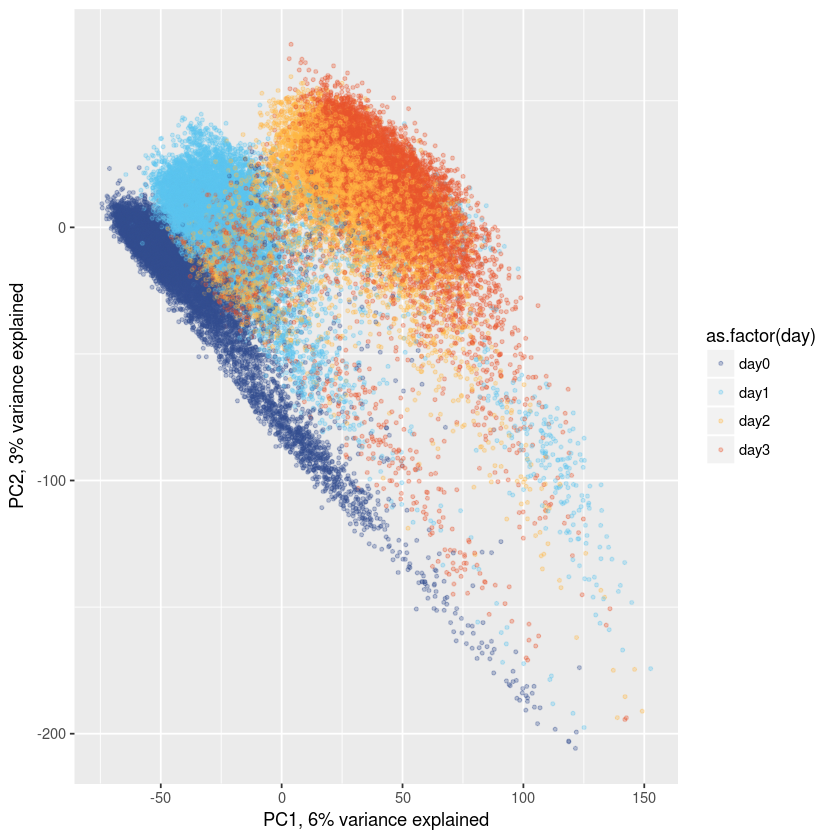

In [36]:
df = as.data.frame(cbind(pca$x[,1:2], sce$day))
colnames(df)[3] <- "day"
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day))) + 
        geom_point(alpha = 0.3, size = 0.8) + scale_color_canva(palette = "Pool party") +
        xlab("PC1, 6% variance explained") + ylab("PC2, 3% variance explained")

In [19]:
sce <- runPCA(sce, ncomponents = 50)

In [20]:
saveRDS(sce, "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_beforefilt.rds")

In [2]:
sce = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_beforefilt.rds")

In [37]:
dim(sce)
length(unique(sce$donor))

[1] 11231 37607

[1] 137

In [29]:
#sce_filt = sce[,!(colData(sce)$plate_id == "3345")]

In [30]:
# dim(sce_filt)
# length(unique(sce_filt$donor))

In [38]:
sce_3301 = sce[,colData(sce)$plate_id == "3301"]
unique(gsub("#.*","",colData(sce_3301)$sample_id))

[1] "25216_2" "25216_4"

In [39]:
dim(sce_3301[,gsub("#.*","",colData(sce_3301)$sample_id) == "25216_2"])
dim(sce_3301[,gsub("#.*","",colData(sce_3301)$sample_id) == "25216_4"])

[1] 11231   254

[1] 11231   328

In [40]:
sce_2519 = sce[,colData(sce)$plate_id == "2519"]
unique(gsub("#.*","",colData(sce_2519)$sample_id))

[1] "23794_5" "23794_6"

In [41]:
dim(sce_2519[,gsub("#.*","",colData(sce_2519)$sample_id) == "23794_5"])
dim(sce_2519[,gsub("#.*","",colData(sce_2519)$sample_id) == "23794_6"])

[1] 11231   106

[1] 11231   106

In [42]:
sce19 = sce[,sce$experiment == "expt_19"]
table(sce19$donor, sce19$day)

      
       day0 day1 day2 day3
  fasu    5    1   17    5
  fuai   12    1    9    4
  kegd    8    2    8    7
  xojn    8    1   10   14
  zerv   15    1   12   15
  zoio    8    4   20   17

In [43]:
sce06 = sce[,sce$experiment == "expt_06"]
table(sce06$donor, sce06$day)

      
       day1 day2 day3
  bima   19    1    4
  lexy    9    3    3
  oapg    5    1    1
  pamv   12    7    5
  rozh    7    2    4

In [44]:
sce01 = sce[,sce$experiment == "expt_01"]
table(sce01$donor, sce01$day)

      
       day3
  eika    4
  eipl    2
  kuxp   21
  pahc    4
  podx   21
  xugn   21

In [45]:
sce20_0 = sce[,sce$experiment == "expt_20"& sce$day == "day0"]
table(sce20_0$donor, sce20_0$day)

      
       day0
  fasu   20
  iudw   10
  kajh    8
  tavh    2
  tout    8

In [46]:
sce3_3 = sce[,sce$experiment == "expt_03" & sce$day == "day3"]
table(sce3_3$donor, sce3_3$day)

      
       day3
  bubh    7
  eika    4
  ffdm   18
  jufd   10
  oaaz    8

In [47]:
sce28_3 = sce[,sce$experiment == "expt_28" & sce$day == "day3"]
table(sce28_3$donor, sce28_3$day)

      
       day3
  iiyk   15
  laey   24
  letw   68
  miaj   14
  poih   41
  rutc   46

In [48]:
sce32_23 = sce[,sce$experiment == "expt_32" & sce$day %in% c("day2","day3")]
table(sce32_23$donor, sce32_23$day)

      
       day2 day3
  guss   94   71
  lepk   13    2
  mita   51   37
  nocf   25   11
  oibg  155  140

In [49]:
sce_filt = sce[,!(colData(sce)$plate_id %in% c("3345",              # expt 42, day0 (there is only rep1)
                                              "2034",               # expt 30, day2, rep2 
                                              "3156", "3157",       # expt 37, day3, rep1 & rep2
                                              "1223",               # expt 20, day0 (before diff 28 there are no reps)
                                              "1655"))   &          # expt 27, day2 (before diff 28 there are no reps) 
                  !(sce$experiment %in% c("expt_01", "expt_03", "expt_06", "expt_19")) &
                  !(gsub("#.*","",colData(sce)$sample_id) %in% c("23794_6",  # plate 2519 was seq 2x (diff32,day2,rep1)
                                                                "25216_2")) # plate 3301 was seq 2x (diff39,day1,rep2)             
              ]

In [50]:
# experiment 27 plates were swapped between day1, day3
sce_filt[,colData(sce_filt)$plate_id == "1654"]$day = "day1"
sce_filt[,colData(sce_filt)$plate_id == "1652"]$day = "day3"

In [51]:
dim(sce_filt)

[1] 11231 36258

In [52]:
# also not clear why ffdm/fpdm was included as a donor for expt 27, removed
sce_filt = sce_filt[,!(sce_filt$experiment == "expt_27" & !(sce_filt$donor %in% c("letw","oilg","quls","rutc","sohd","vazt")))]

In [53]:
dim(sce)
length(unique(sce$donor))
length(unique(sce[,sce$day == "day0"]$donor))
length(unique(sce[,sce$day == "day1"]$donor))
length(unique(sce[,sce$day == "day2"]$donor))
length(unique(sce[,sce$day == "day3"]$donor))

[1] 11231 37607

[1] 137

[1] 122

[1] 118

[1] 120

[1] 128

In [54]:
dim(sce_filt)
length(unique(sce_filt$donor))
length(unique(sce_filt[,sce_filt$day == "day0"]$donor))
length(unique(sce_filt[,sce_filt$day == "day1"]$donor))
length(unique(sce_filt[,sce_filt$day == "day2"]$donor))
length(unique(sce_filt[,sce_filt$day == "day3"]$donor))

[1] 11231 36044

[1] 125

[1] 111

[1] 111

[1] 104

[1] 108

In [55]:
sce_filt

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(115): adj_x adj_y ... donor_short_id donor_long_id
reducedDimNames(0):
spikeNames(1): ERCC

In [56]:
pca_filt = prcomp(t(logcounts(sce_filt)))
summary(pca_filt)

Importance of components:
                            PC1      PC2      PC3      PC4      PC5      PC6
Standard deviation     40.91584 28.14546 20.83434 17.93491 16.62531 15.24688
Proportion of Variance  0.06291  0.02977  0.01631  0.01209  0.01039  0.00874
Cumulative Proportion   0.06291  0.09267  0.10898  0.12107  0.13146  0.14019
                            PC7      PC8      PC9     PC10     PC11     PC12
Standard deviation     14.51141 12.43880 11.90569 11.80837 10.61311 10.47404
Proportion of Variance  0.00791  0.00581  0.00533  0.00524  0.00423  0.00412
Cumulative Proportion   0.14811  0.15392  0.15925  0.16449  0.16872  0.17284
                           PC13   PC14    PC15    PC16    PC17    PC18    PC19
Standard deviation     10.29408 9.7824 9.27345 8.99427 8.60836 8.09824 7.49584
Proportion of Variance  0.00398 0.0036 0.00323 0.00304 0.00278 0.00246 0.00211
Cumulative Proportion   0.17682 0.1804 0.18365 0.18669 0.18947 0.19194 0.19405
                          PC20    PC21    

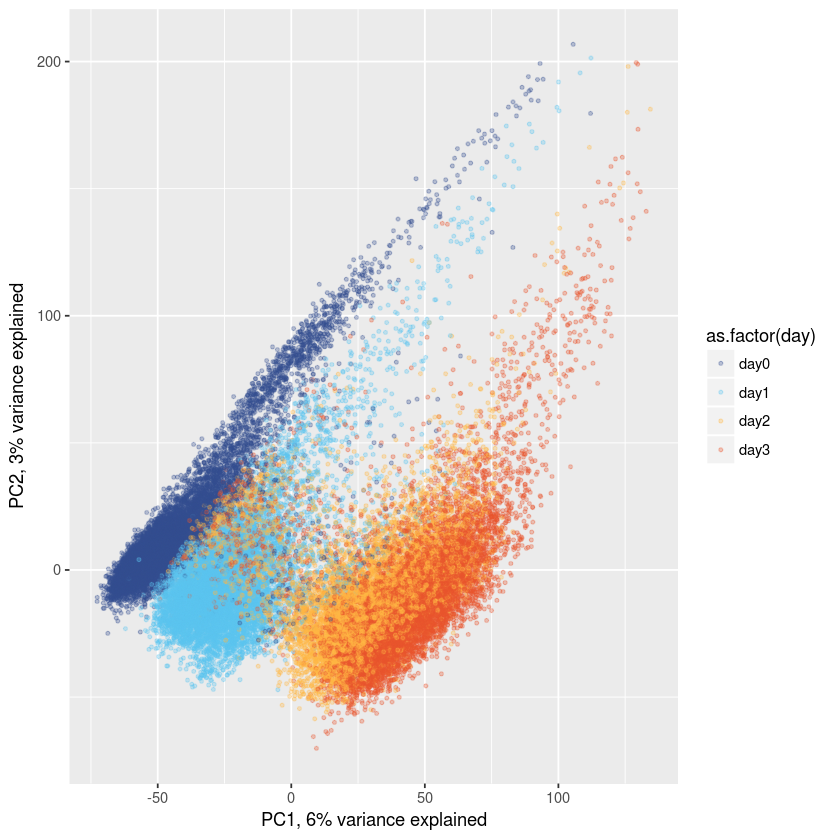

In [57]:
df = as.data.frame(cbind(pca_filt$x[,1:2], sce_filt$day))
colnames(df)[3] <- "day"
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day))) + 
        geom_point(alpha = 0.3, size = 0.8) + scale_color_canva(palette = "Pool party") +
        xlab("PC1, 6% variance explained") + ylab("PC2, 3% variance explained")

In [12]:
saveRDS(sce_filt, "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.rds")

In [11]:
sce_filt <- runPCA(sce_filt, ncomponents = 50)

In [2]:
sce_filt = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.rds")

In [13]:
sce_filt

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(115): adj_x adj_y ... donor_short_id donor_long_id
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [16]:
sce_new

class: SingleCellExperiment 
dim: 11231 31751 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(31751): 22606_5#10 22606_5#100 ... 24539_8#97 24539_8#98
colData names(115): adj_x adj_y ... donor_short_id donor_long_id
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [14]:
# only new experiment
sce_new = sce_filt[, !(sce_filt$experiment %in% c("expt_09", "expt_10", "expt_12", "expt_18", "expt_20", "expt_21", "expt_22", "expt_23", "expt_24"))]

In [15]:
# cells, # donors
dim(sce_new) # genes, cells
length(unique(sce_new$donor)) # donors
length(unique(sce_new[,sce_new$day == "day0"]$donor)) #  donors (day0)
length(unique(sce_new[,sce_new$day == "day1"]$donor)) #  donors (day1)
length(unique(sce_new[,sce_new$day == "day2"]$donor)) #  donors (day2)
length(unique(sce_new[,sce_new$day == "day3"]$donor)) #  donors (day3)

[1] 11231 31751

[1] 99

[1] 93

[1] 88

[1] 92

[1] 93

In [18]:
# save
saveRDS(sce_new, "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_expts27on.rds")

In [17]:
sce_new <- runPCA(sce_new, ncomponents = 50)

In [49]:
sce = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.rds")

In [50]:
sce

class: SingleCellExperiment 
dim: 11231 36258 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(36258): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(113): adj_x adj_y ... x y
reducedDimNames(0):
spikeNames(1): ERCC

In [51]:
sce[,colData(sce)$plate_id == "1654"]$day = "day1"
sce[,colData(sce)$plate_id == "1652"]$day = "day3"

In [52]:
sce = sce[,!(sce$experiment == "expt_03")]

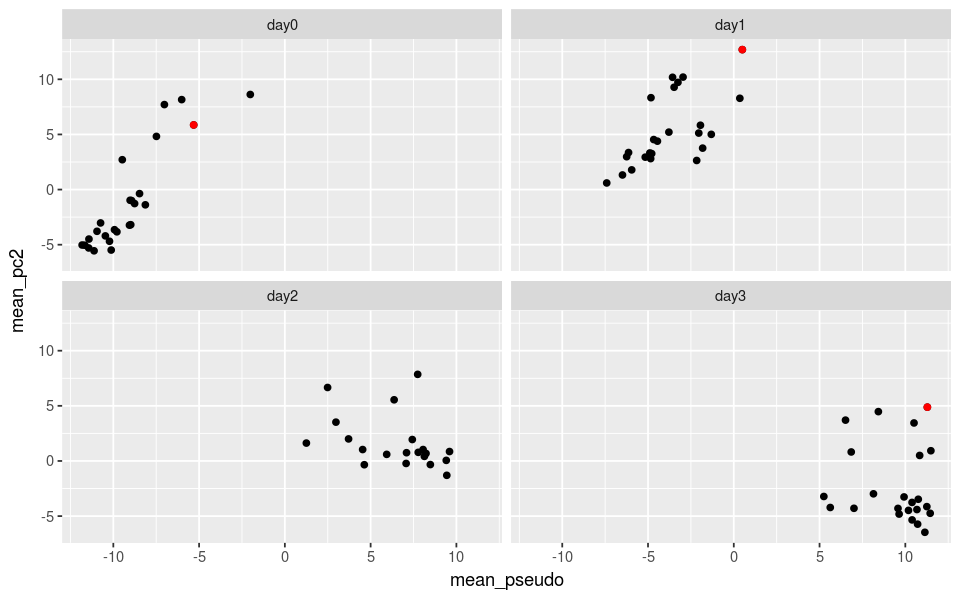

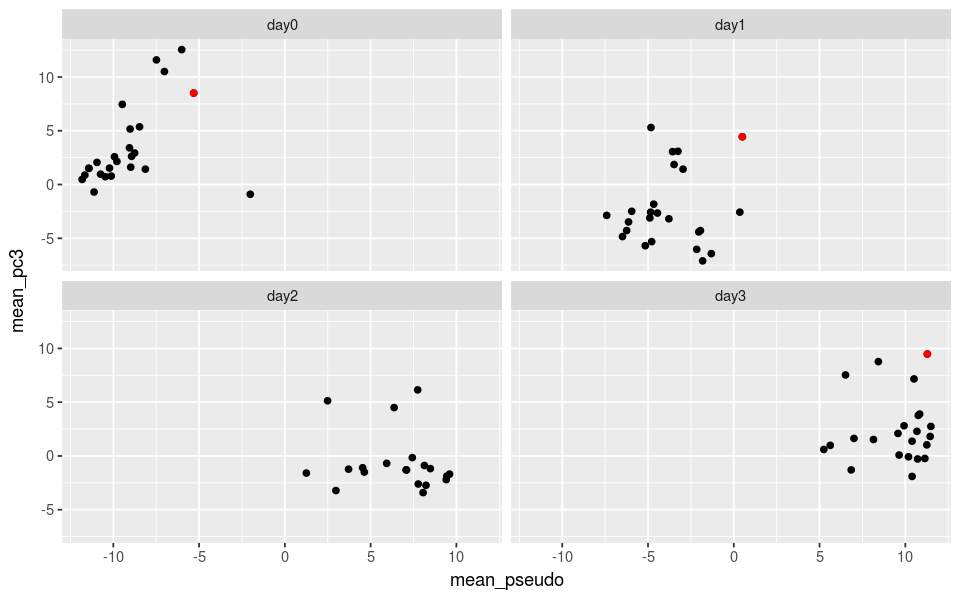

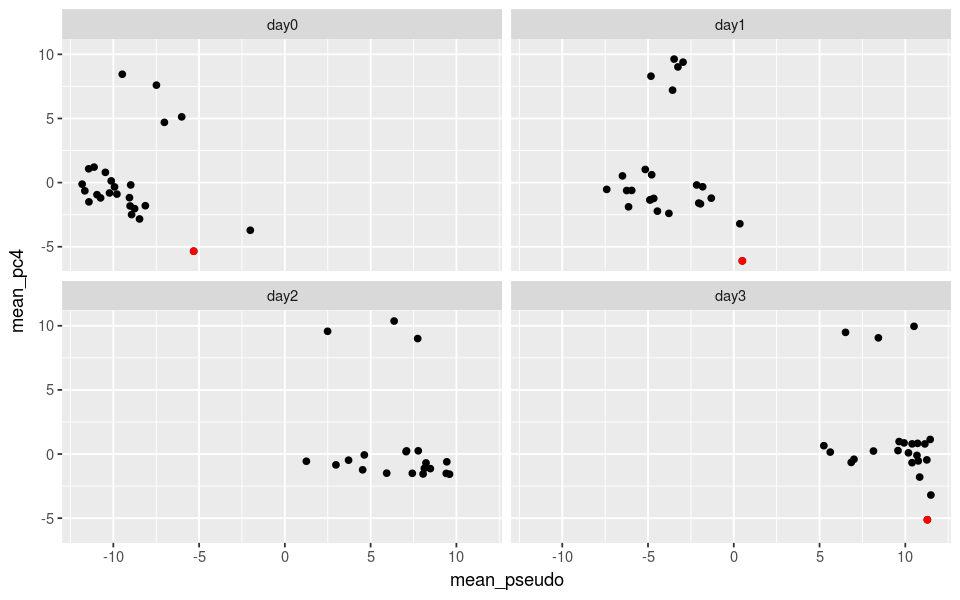

In [8]:
# sce$pc2 = prcomp(t(logcounts(sce)))$x[,2]
# sce$pc3 = prcomp(t(logcounts(sce)))$x[,3]
# sce$pc4 = prcomp(t(logcounts(sce)))$x[,4]

options(repr.plot.width = 8, repr.plot.height = 5) 
#df = as.data.frame(cbind(sce$experiment, sce$day, sce$pc1_top500hvg, sce$pc2, sce$pc3, sce$pc4))
#colnames(df) = c("expt","day","pseudotime","pc2","pc3","pc4")

df = as.data.frame(cbind(sce$experiment, sce$day, reducedDim(sce)[,1:4]))
colnames(df) = c("expt","day","pseudotime","pc2","pc3","pc4")
# head(df)
df$expt_day = paste0(df$expt,"-",df$day)
df0 = df %>% group_by(expt_day) %>% 
            summarise(mean_pseudo = mean(as.numeric(pseudotime)), 
                      mean_pc2 = mean(as.numeric(pc2)),
                     mean_pc3 = mean(as.numeric(pc3)),
                     mean_pc4 = mean(as.numeric(pc4)))
df0$expt = gsub("*-.*","",df0$expt_day)
df0$day = gsub(".*-","",df0$expt_day)
ggplot(df0, aes(x = mean_pseudo, y = mean_pc2)) +
        geom_point() +
        geom_point(aes(x = mean_pseudo, y = mean_pc2), colour = "red",
              data = dplyr::filter(df0, expt == "expt_27")) +
        facet_wrap( ~ day)
ggplot(df0, aes(x = mean_pseudo, y = mean_pc3)) +
        geom_point() +
        geom_point(aes(x = mean_pseudo, y = mean_pc3), colour = "red",
              data = dplyr::filter(df0, expt == "expt_27")) +
        facet_wrap( ~ day)
ggplot(df0, aes(x = mean_pseudo, y = mean_pc4)) +
        geom_point() +
        geom_point(aes(x = mean_pseudo, y = mean_pc4), colour = "red",
              data = dplyr::filter(df0, expt == "expt_27")) +
        facet_wrap( ~ day)

In [11]:
sce = sce_filt

In [12]:
sum(rowSums(table(sce$donor, sce$day)>0)==4)
sum(rowSums(table(sce$donor, sce$day)>0)==3)
sum(rowSums(table(sce$donor, sce$day)>0)==2)
sum(rowSums(table(sce$donor, sce$day)>0)==1)

[1] 84

[1] 19

[1] 19

[1] 3

In [1]:
hist(rowSums(table(sce$donor, sce$day)>0), main = "", xlab = "#days per donor", col = "cornflowerblue")

# sum(rowSums(table(sce$experiment, sce$day)>0)==4)
# sum(rowSums(table(sce$experiment, sce$day)>0)==3)
# sum(rowSums(table(sce$experiment, sce$day)>0)==2)
# sum(rowSums(table(sce$experiment, sce$day)>0)==1)

hist(rowSums(table(sce$experiment, sce$day)>0), main = "", xlab = "#days per experiment", col = "cornflowerblue")

hist(log(rowSums(table(sce$donor, sce$day))), main = "", xlab = "#cells per donor (log)", col = "cornflowerblue")

hist(rowSums(table(sce$experiment, sce$day)), main = "", xlab = "#cells per experiment", col = "cornflowerblue")

hist(rowSums(table(sce$donor, sce$experiment)>0), main = "", xlab = "#experiments per donor", col = "cornflowerblue")

barplot(table(sce$day), xlab = "#cells per day", col = "cornflowerblue")

ERROR: Error in table(sce$donor, sce$day): object 'sce' not found


In [20]:
df = as.data.frame(cbind(sce$day, sce$donor, sce$experiment, reducedDim(sce)[,1:10]))
colnames(df)[1:3] = c("day","donor","expt")
head(df)

,day,donor,expt,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
21843_1#10,day1,joxm,expt_09,-2.96677786363531,-5.05169956500682,2.55770533489983,1.7846318103175,-3.80009323575857,2.75208894128767,0.0401141944765882,-0.652102629299532,-2.4088644910377,-1.47459524951616
21843_1#100,day1,fafq,expt_09,2.99582683728982,-9.41697493671861,3.94524251382824,4.62898601173339,-1.26713321367618,1.63780748962321,0.246228751075421,2.11823943184555,-0.174299911561691,-1.11844311700623
21843_1#101,day1,fafq,expt_09,-0.0886777527873126,-6.76902824585241,5.61347179926158,1.89045075594935,-1.33555646580109,0.608968440765403,0.801283254258879,0.424800831499244,1.09505083093225,1.1932872400308
21843_1#102,day1,wuye,expt_09,-5.0017174639966,-4.7271626935081,2.40088570996881,2.02555201438297,-2.00952442375543,5.22017632306519,1.46083793859232,-1.89020695256019,-0.483610121585703,0.609958304896949
21843_1#103,day1,joxm,expt_09,-2.0819387238602,-6.20989267302763,4.67532539048542,0.593331817409915,-0.648182781492643,3.46958318825382,-0.366746971802062,-0.727860388940214,-0.636698779237812,0.339505715972403
21843_1#105,day1,iisa,expt_09,-0.710124536503605,-6.39211226664126,4.80988948282906,0.504861627549062,-0.483425669094342,1.2074208499709,3.08038258782637,0.0534789184886388,-1.78876073574724,-2.42693464309015


In [21]:
library(ggthemes)

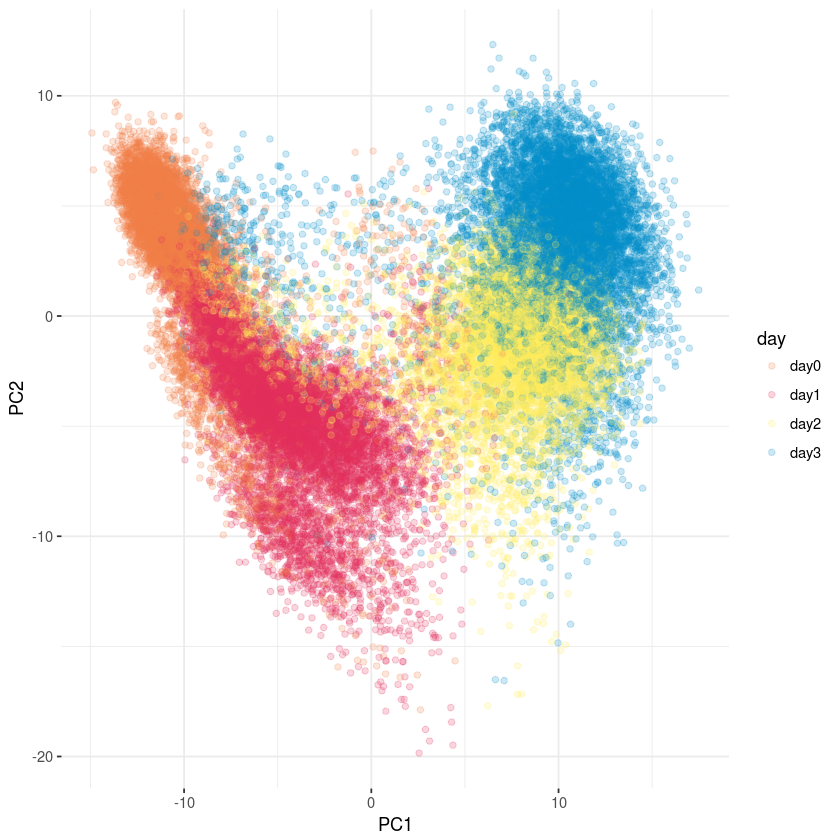

In [22]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Candy coated brights") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

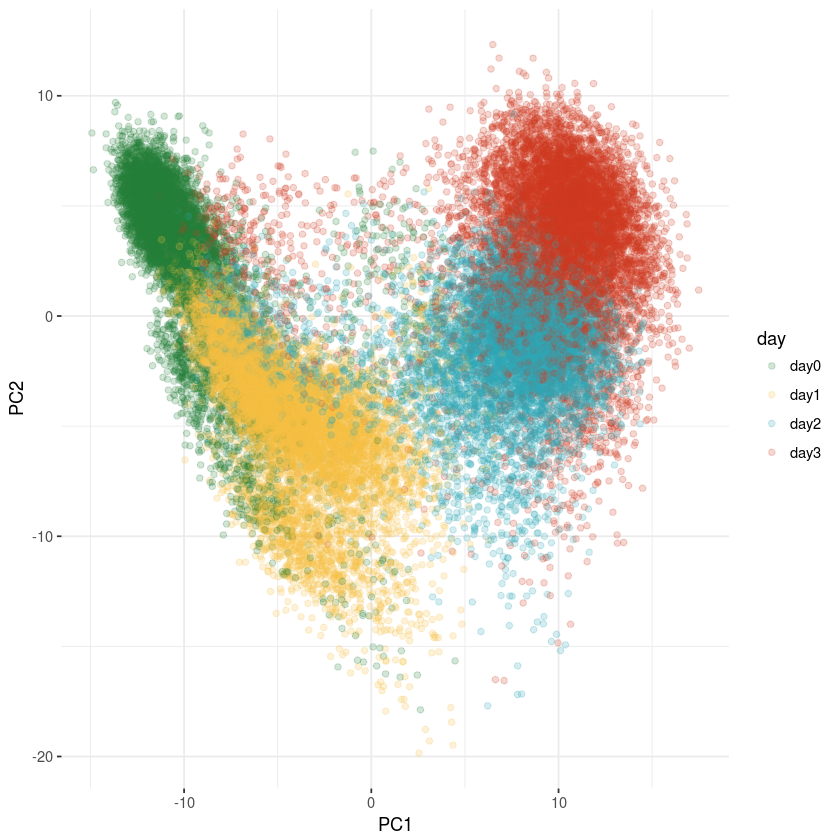

In [23]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Cheerful brights") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

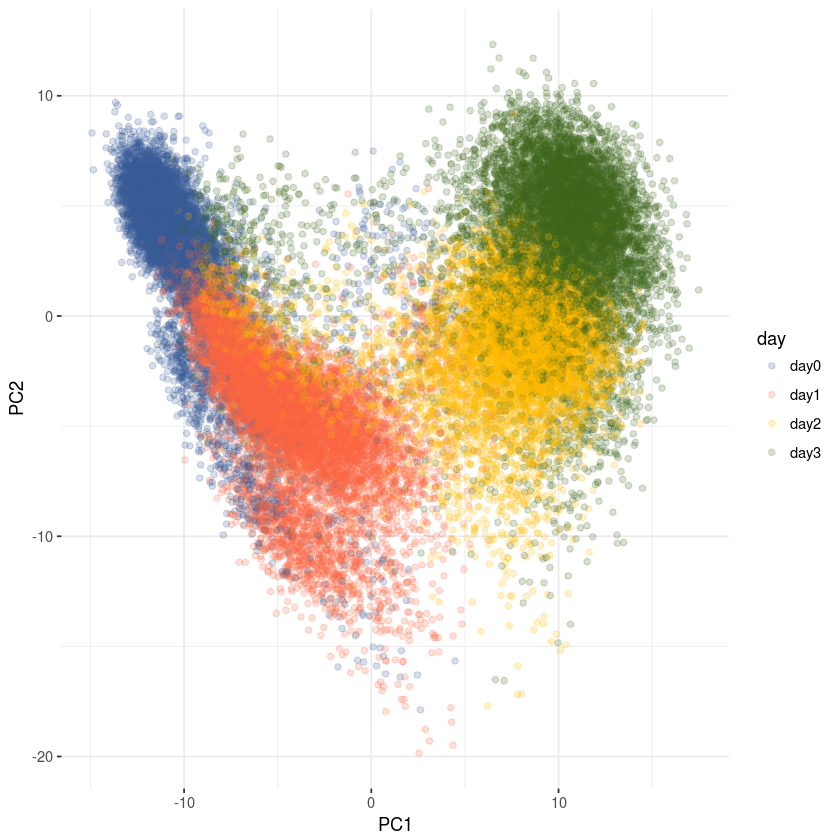

In [24]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Primary colors with a vibrant twist") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

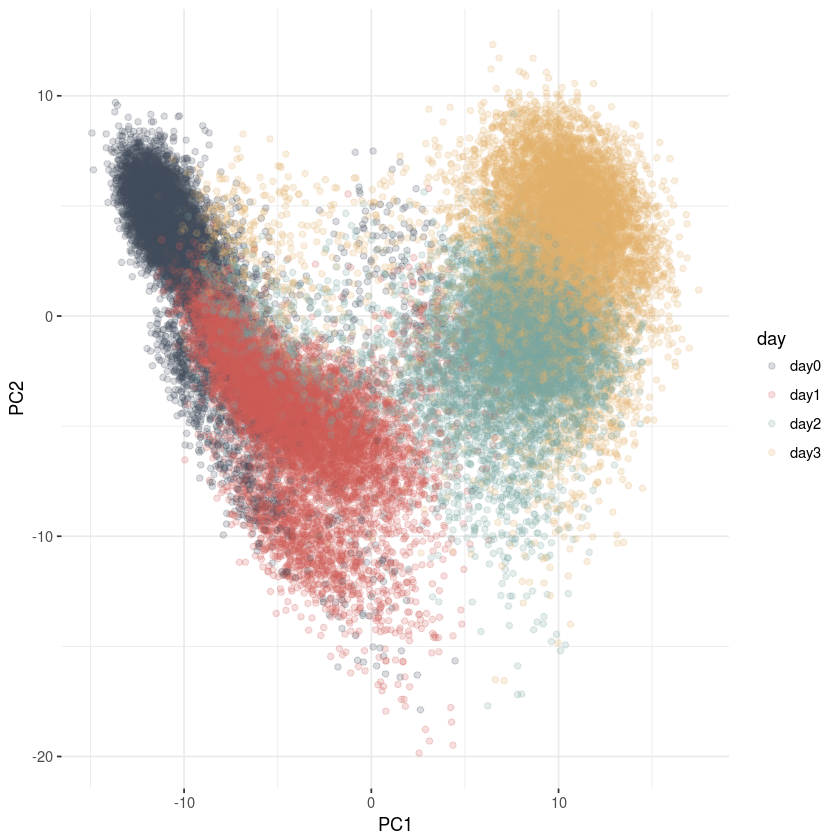

In [25]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Warm and cool") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

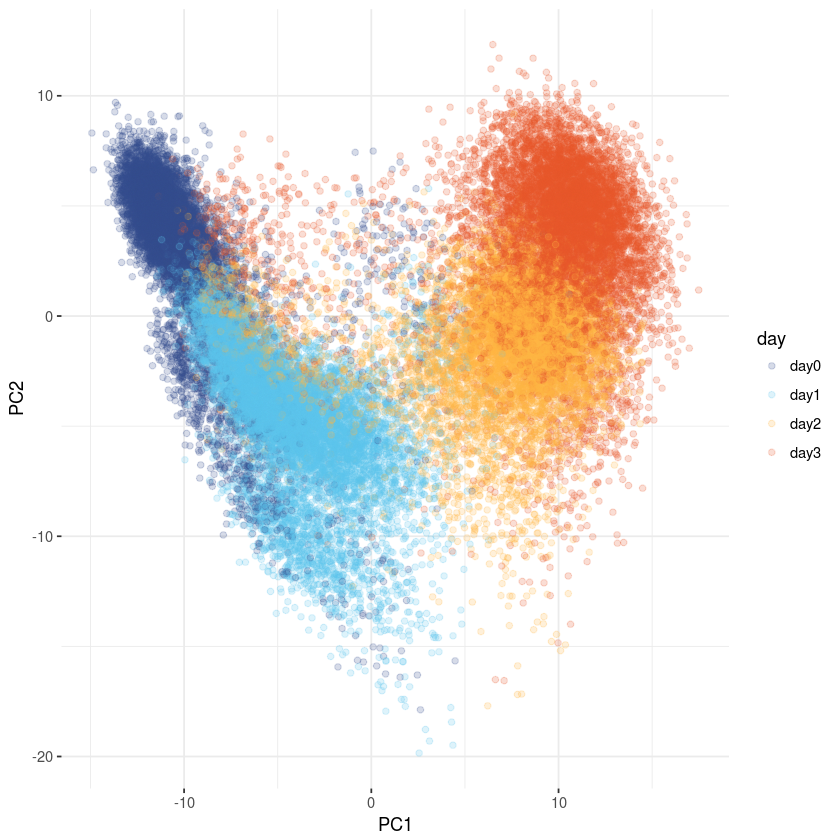

In [26]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Pool party") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

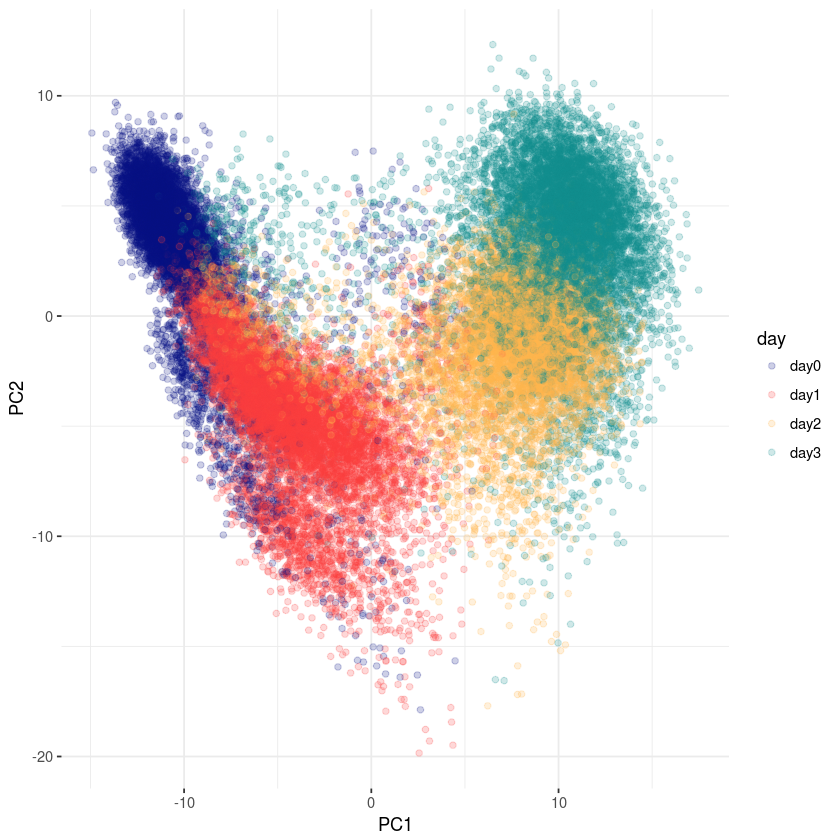

In [27]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Bright and painterly") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

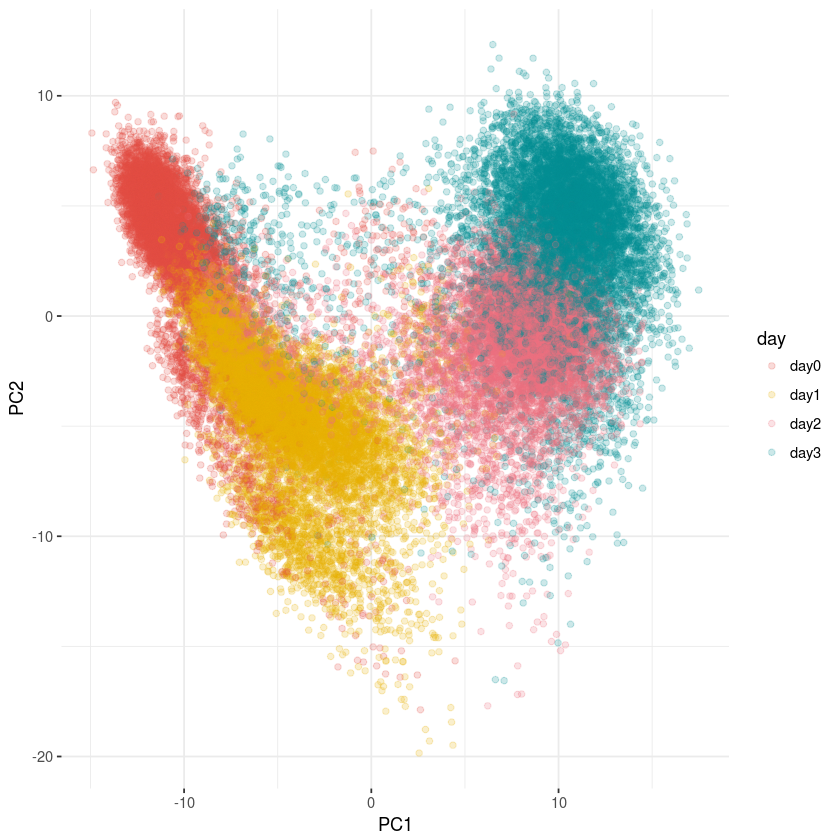

In [28]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Bold and punchy") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

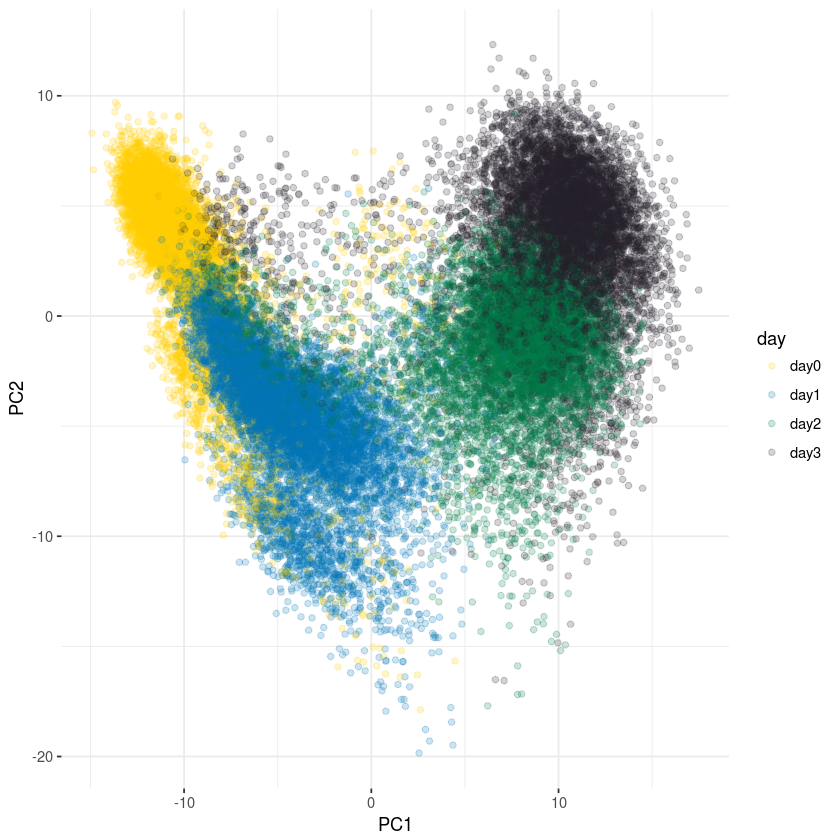

In [29]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Art history inspired") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

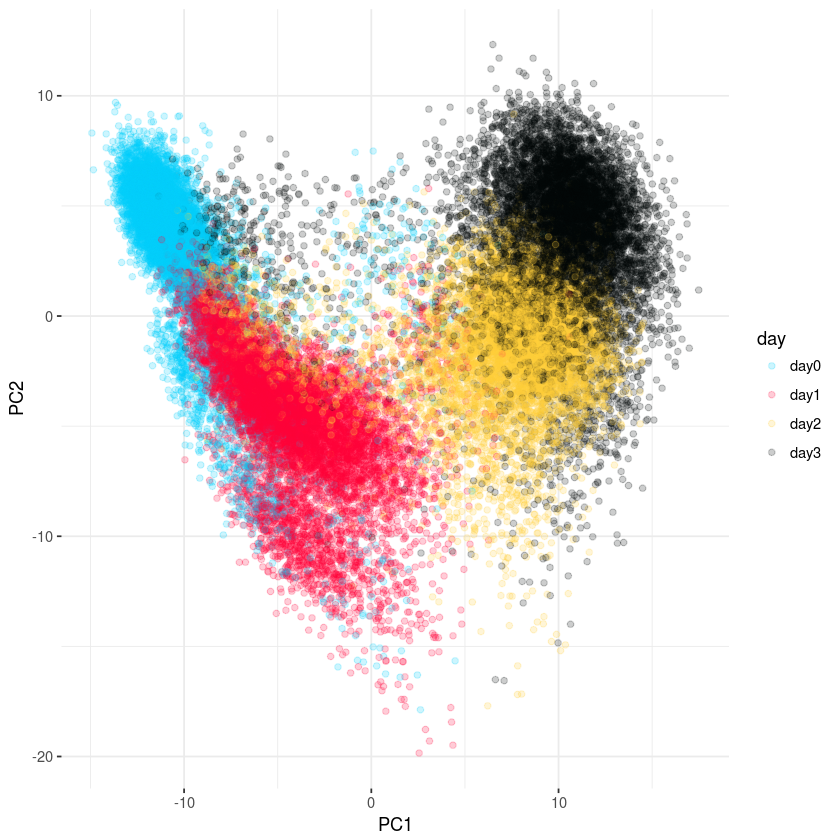

In [30]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Nightlife") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

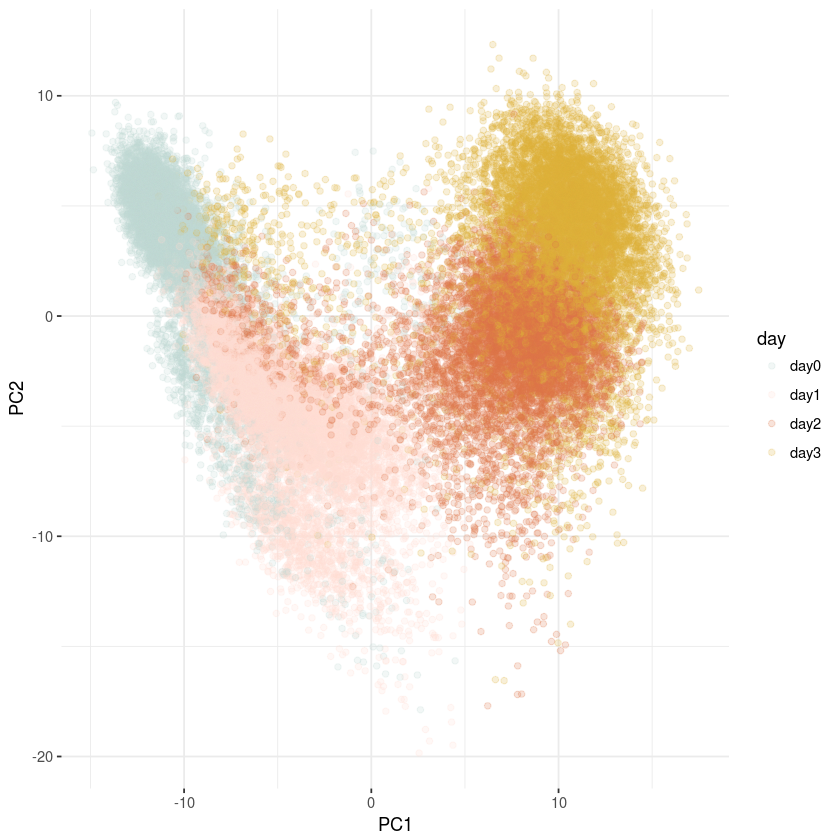

In [31]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = day)) + geom_point(alpha = 0.2) + 
        scale_colour_canva(palette = "Pretty pastels") + theme_bw() + xlab("PC1") + ylab("PC2") +
        theme(panel.border = element_blank())

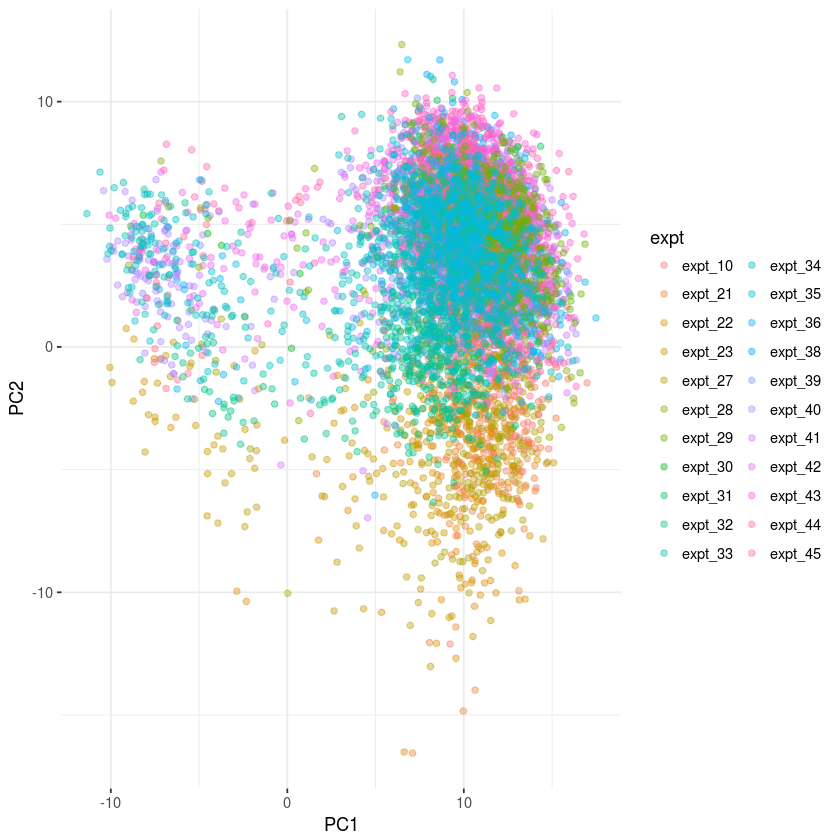

In [37]:
ggplot(df[df$day == "day3",], aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = expt)) + 
        geom_point(alpha = 0.4) + 
        #scale_colour_manual(values = c(col_list,col_list)) + 
        theme_bw() + xlab("PC1") + 
        ylab("PC2") + theme(panel.border = element_blank())

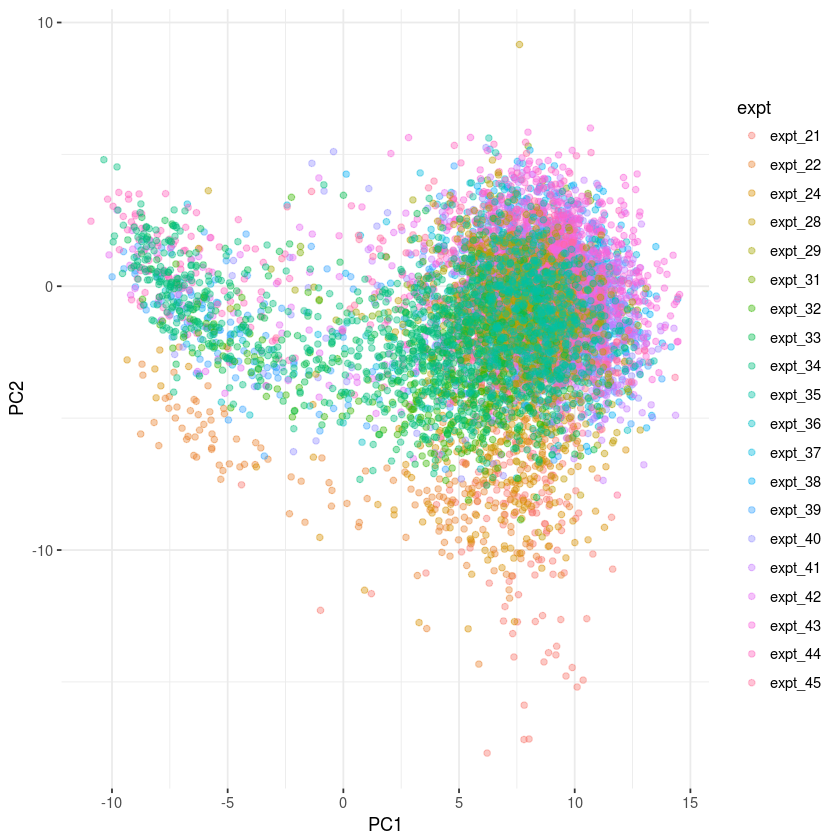

In [36]:
ggplot(df[df$day == "day2",], aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = expt)) + 
        geom_point(alpha = 0.4) + 
        #scale_colour_manual(values = c(col_list,col_list)) + 
        theme_bw() + xlab("PC1") + 
        ylab("PC2") + theme(panel.border = element_blank())

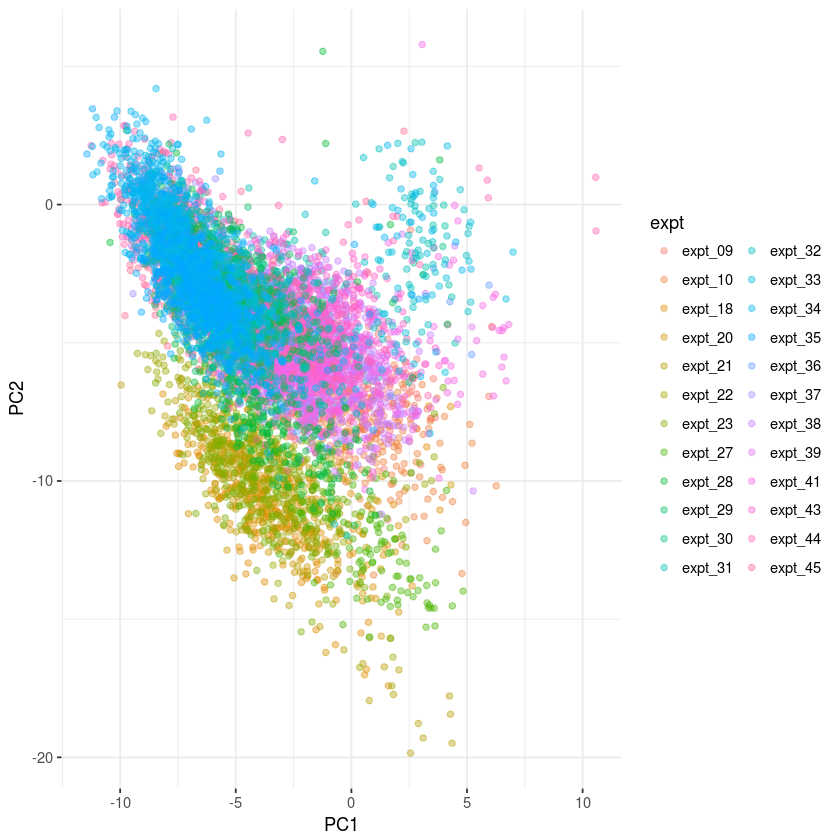

In [35]:
ggplot(df[df$day == "day1",], aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = expt)) + 
        geom_point(alpha = 0.4) + 
        #scale_colour_manual(values = c(col_list,col_list)) + 
        theme_bw() + xlab("PC1") + 
        ylab("PC2") + theme(panel.border = element_blank())

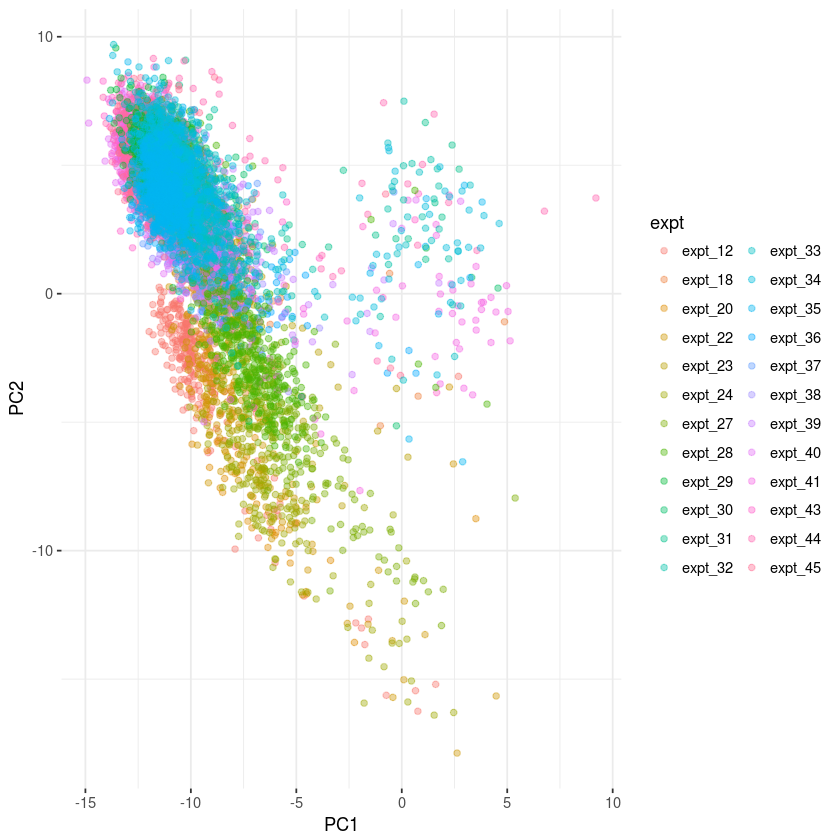

In [34]:
ggplot(df[df$day == "day0",], aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = expt)) + 
        geom_point(alpha = 0.4) + 
        #scale_colour_manual(values = c(col_list,col_list)) + 
        theme_bw() + xlab("PC1") + 
        ylab("PC2") + theme(panel.border = element_blank())

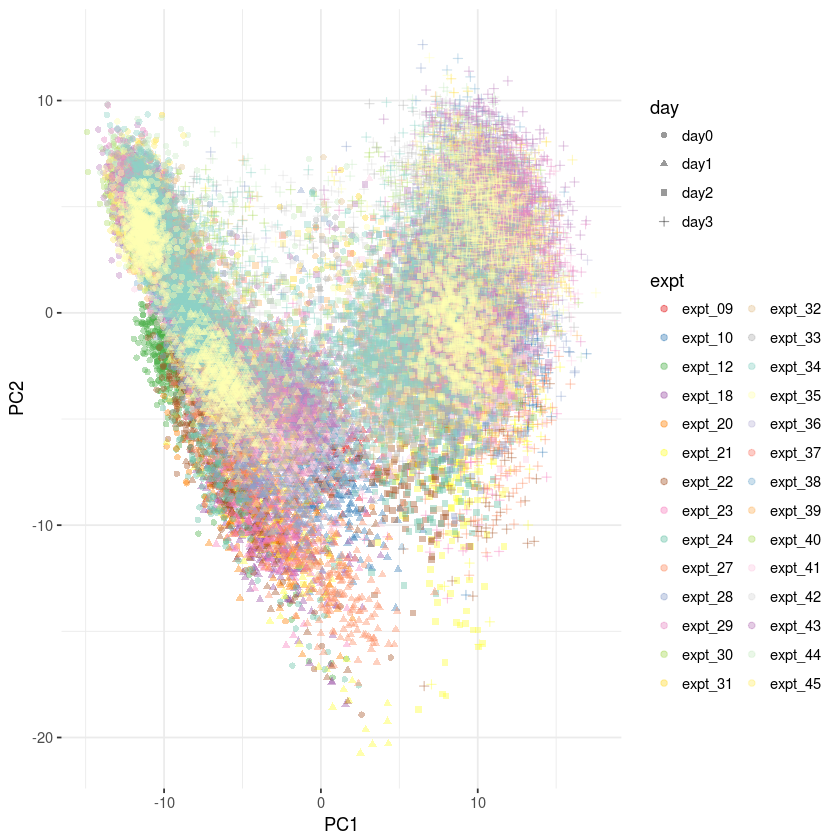

In [109]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = expt, shape = day)) + 
        geom_point(alpha = 0.4) + 
        scale_colour_manual(values = c(col_list,col_list)) + theme_bw() + xlab("PC1") + 
        ylab("PC2") + theme(panel.border = element_blank())

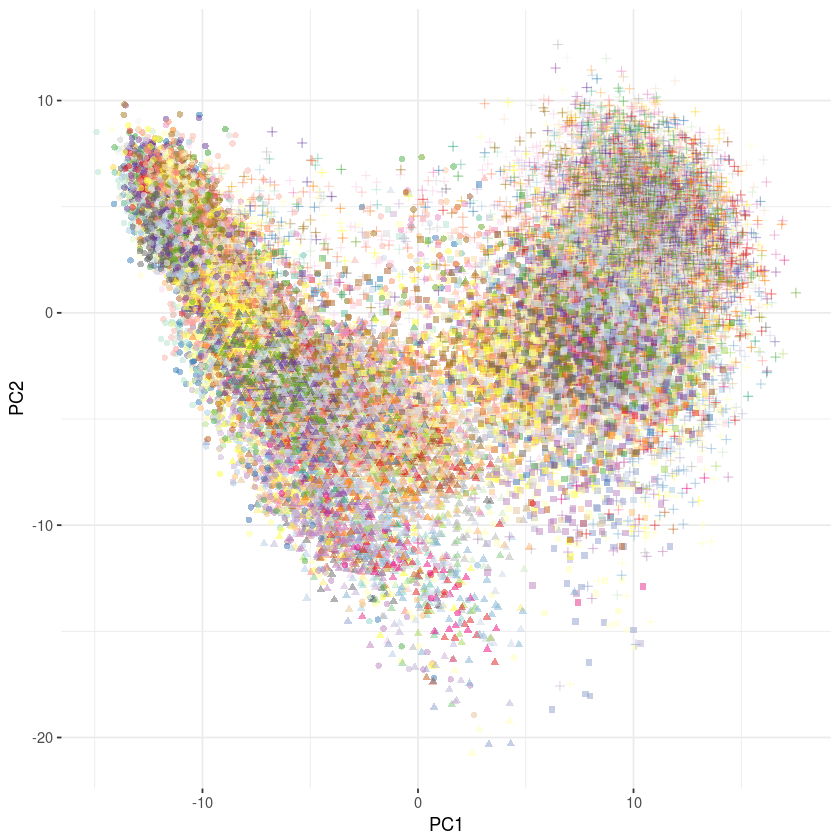

In [105]:
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = donor, shape = day)) + 
        geom_point(alpha = 0.5) + 
        scale_colour_manual(values = c(col_list,col_list)) + theme_bw() + xlab("PC1") + 
        ylab("PC2") + theme(legend.position = "none", panel.border = element_blank())

In [123]:
saveRDS(sce, "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180227/sce_merged_qc_20180614_strict_filt.rds")

In [11]:
sce23 = sce[,sce$day %in% c("day2","day3")]

In [13]:
sce23[, !(is.na(colData(sce23)$mean_cxcr4_norm_sorted)) & 
                     colData(sce23)$mean_cxcr4_norm_sorted > 0]

class: SingleCellExperiment 
dim: 11231 4801 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(4801): 20759_3#143 20759_3#185 ... 24229_8#65 24229_8#85
colData names(120): adj_x adj_y ... expt_03 expt_45
reducedDimNames(0):
spikeNames(1): ERCC

In [102]:
library(RColorBrewer)
col_list = c(brewer.pal(8,"Set1"), brewer.pal(8,"Set2"), brewer.pal(12,"Set3"), brewer.pal(12,"Paired"),
             brewer.pal(9,"Pastel1"), brewer.pal(8,"Pastel2"), brewer.pal(8,"Dark2"), brewer.pal(8,"Accent"))

In [20]:
unique(sce$experiment)

[1] "expt_03" "expt_09" "expt_10" "expt_12" "expt_18" "expt_20" "expt_21"
 [8] "expt_22" "expt_23" "expt_24" "expt_27" "expt_30" "expt_31" "expt_36"
[15] "expt_37" "expt_38" "expt_39" "expt_40" "expt_41" "expt_42" "expt_43"
[22] "expt_44" "expt_45" "expt_28" "expt_29" "expt_32" "expt_33" "expt_34"
[29] "expt_35"

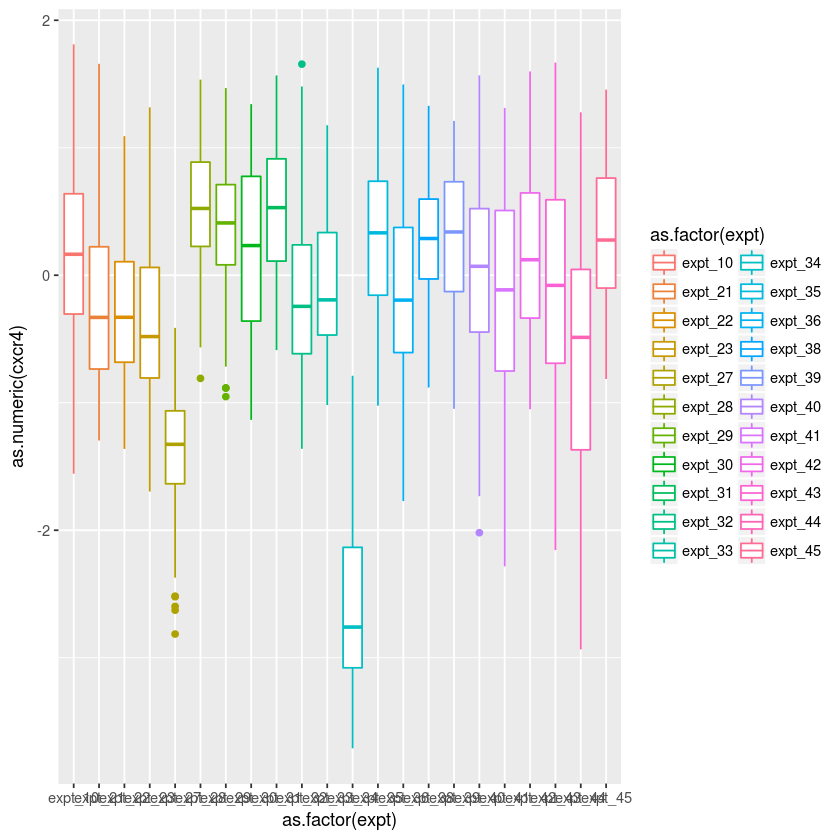

In [38]:
df = as.data.frame(cbind(sce$experiment, sce$day, colData(sce)$mean_cxcr4_norm_sorted))
colnames(df) = c("expt","day","cxcr4")
ggplot(df[df$day == "day3" & !(is.na(df$cxcr4)),], 
       aes( x = as.factor(expt), y = as.numeric(cxcr4), colour = as.factor(expt))) + 
geom_boxplot()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


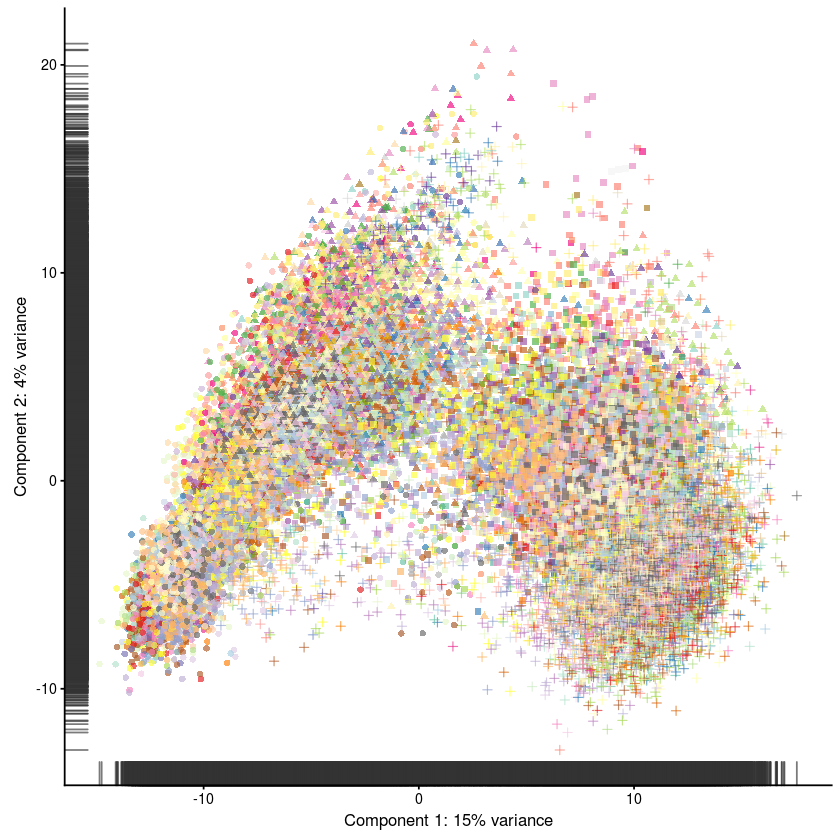

In [38]:
plotPCA(sce_filt, colour_by = "donor", shape_by = "day",
                   ncomponents = 2) +
                   scale_colour_manual(values = c(col_list,col_list))  + theme(legend.position = "none")

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


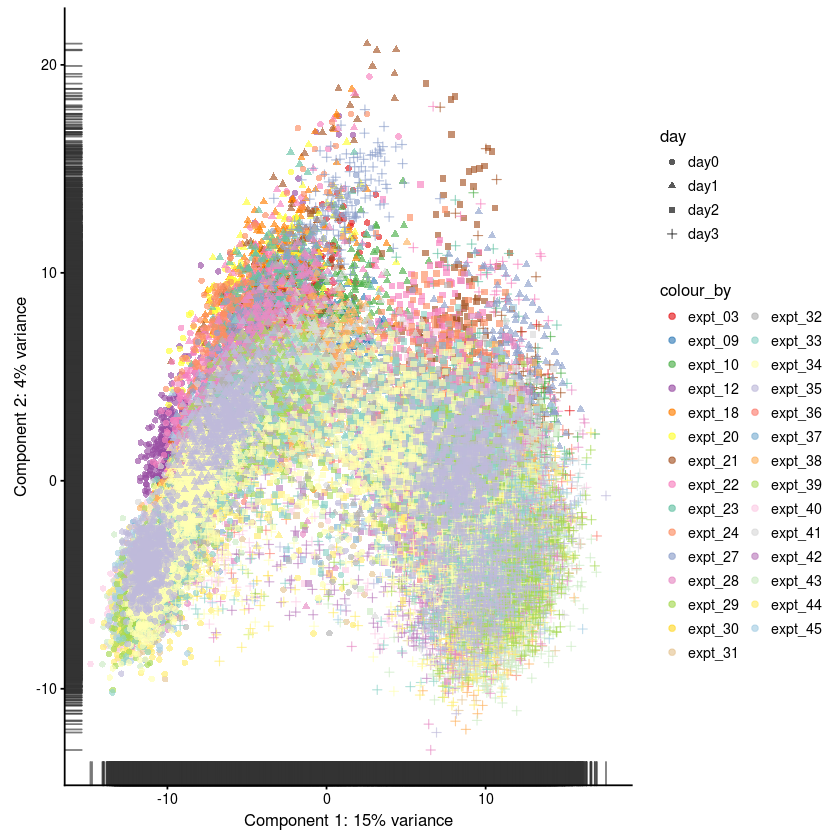

In [39]:
plotPCA(sce_filt, colour_by = "experiment", shape_by = "day",
                   ncomponents = 2) +
                   scale_colour_manual(values = col_list)

In [11]:
sce

class: SingleCellExperiment 
dim: 11231 36588 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(36588): 20759_2#10 20759_2#100 ... 24539_8#97 24539_8#98
colData names(115): adj_x adj_y ... pc1_top500hvg donor_long_id
reducedDimNames(0):
spikeNames(1): ERCC

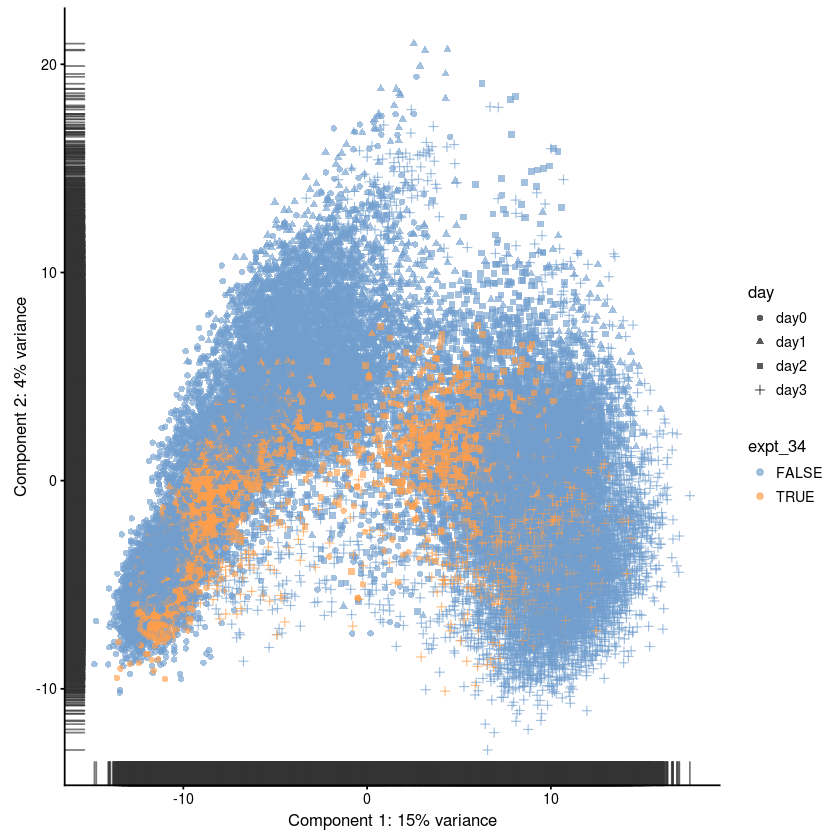

In [42]:
sce$expt_34 = (sce$experiment == "expt_34")
plotPCA(sce, colour_by = "expt_34", shape_by = "day", ncomponents = 2)

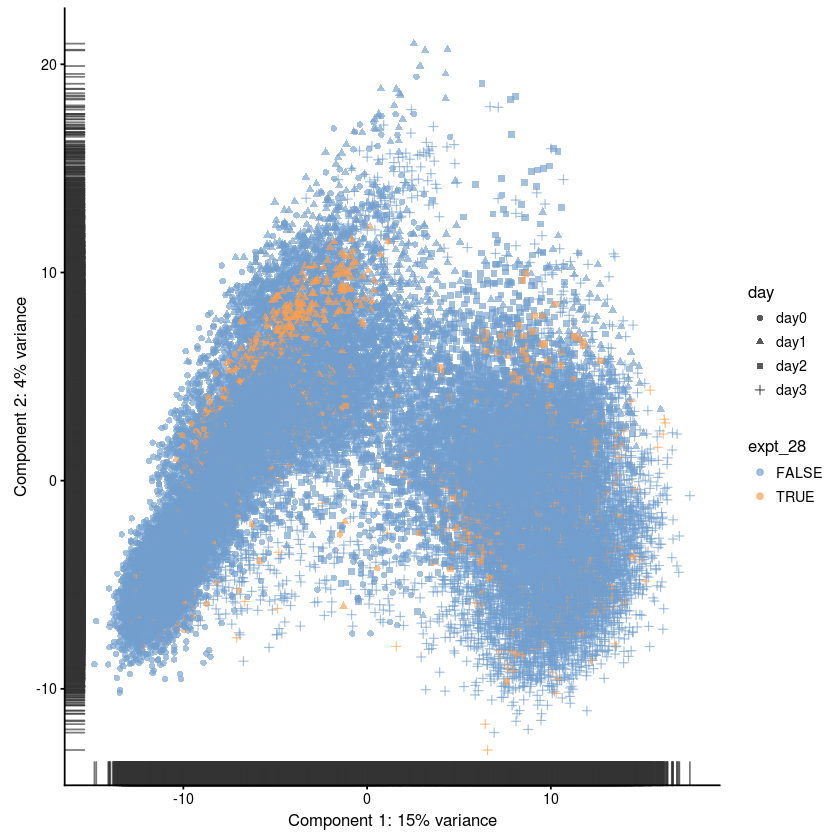

In [9]:
sce$expt_28 = (sce$experiment == "expt_28")
plotPCA(sce, colour_by = "expt_28", shape_by = "day", ncomponents = 2)

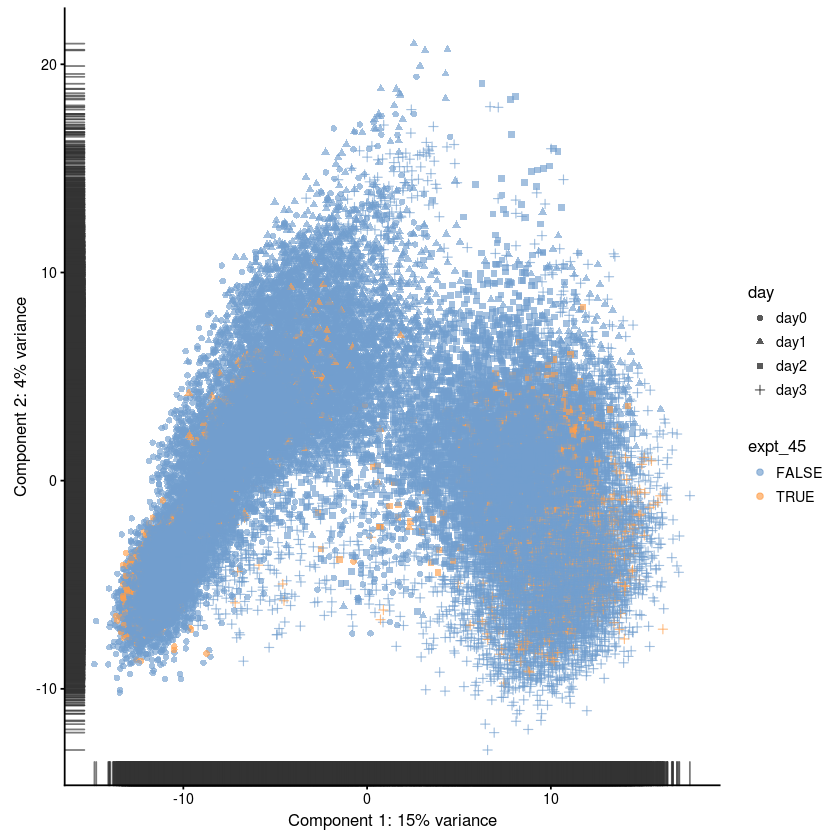

In [10]:
sce$expt_45 = (sce$experiment == "expt_45")
plotPCA(sce, colour_by = "expt_45", shape_by = "day", ncomponents = 2)

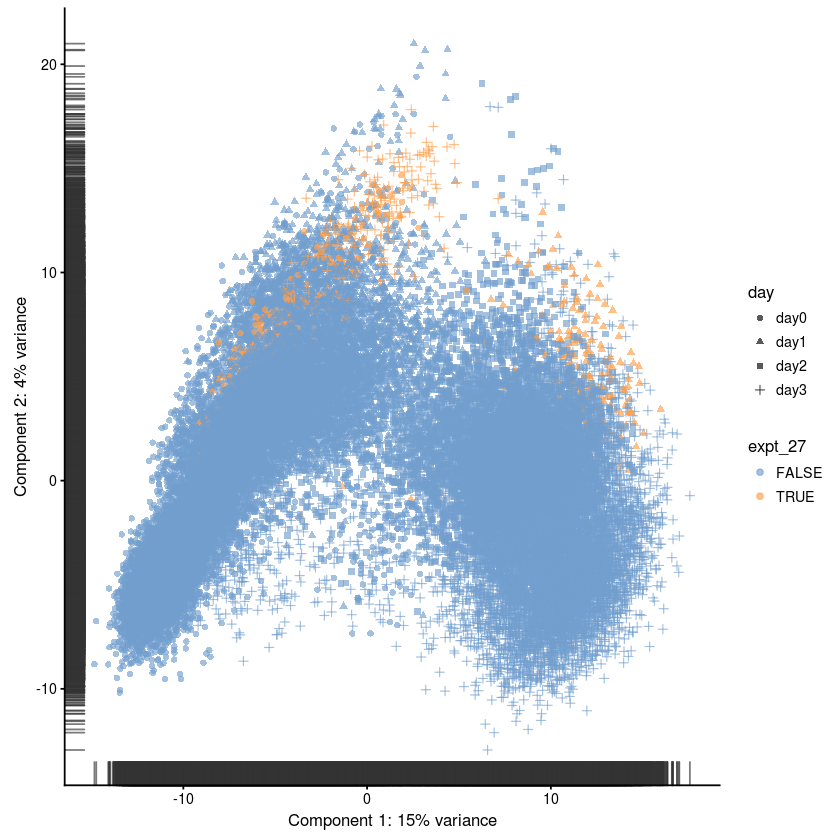

In [5]:
sce$expt_27 = (sce$experiment == "expt_27")
plotPCA(sce, colour_by = "expt_27", shape_by = "day", ncomponents = 2)

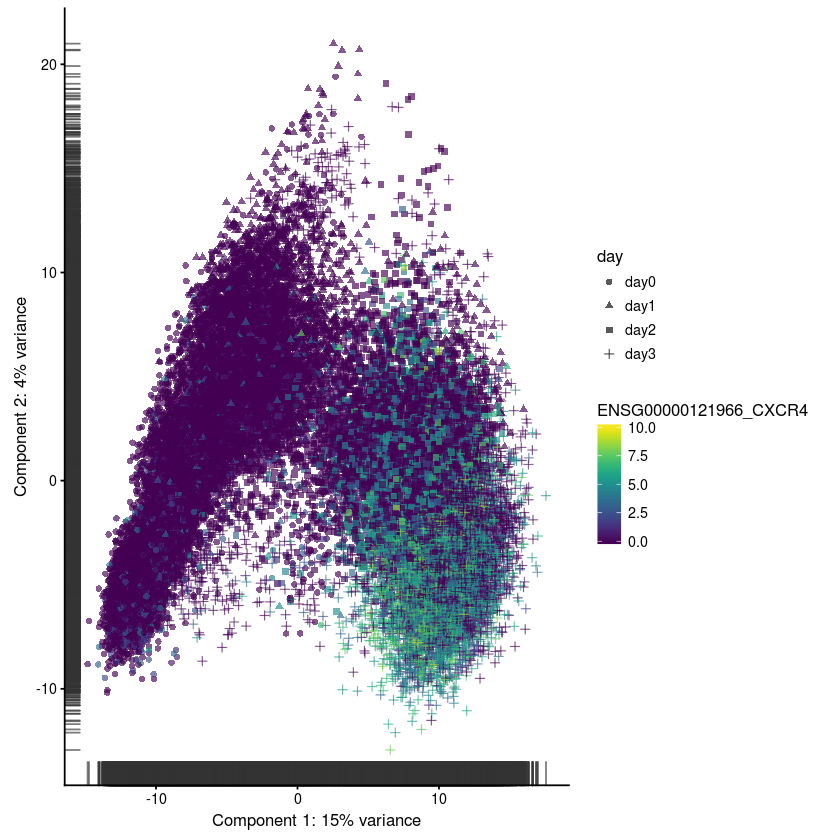

In [8]:
plotPCA(sce, shape_by = "day", ncomponents = 2) + geom_point()

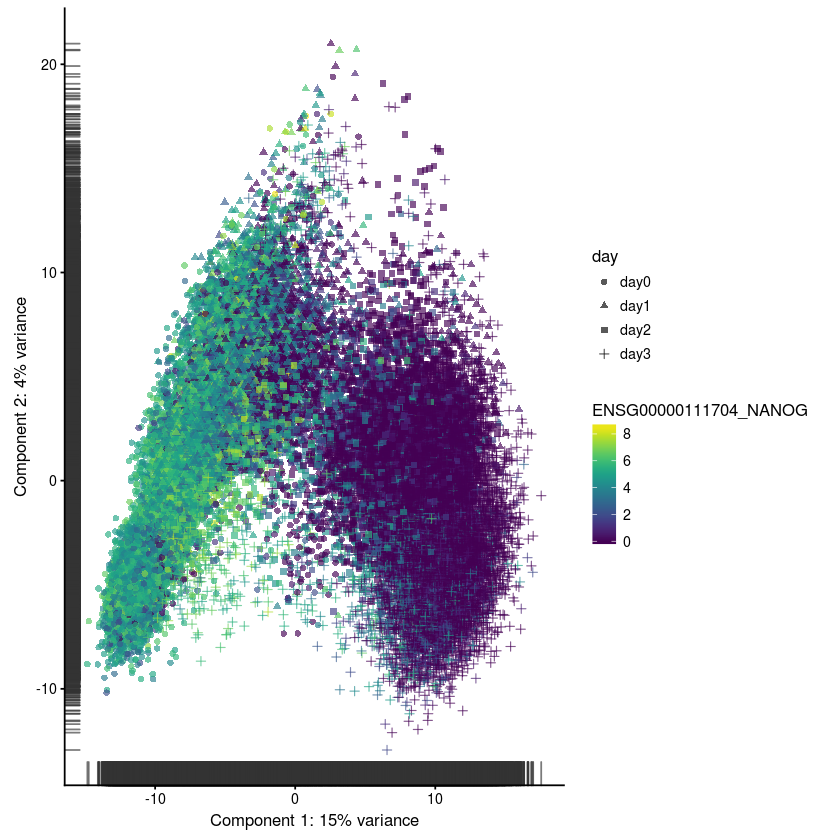

In [10]:
plotPCA(sce, colour_by =  "ENSG00000111704_NANOG", shape_by = "day", ncomponents = 2) 

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


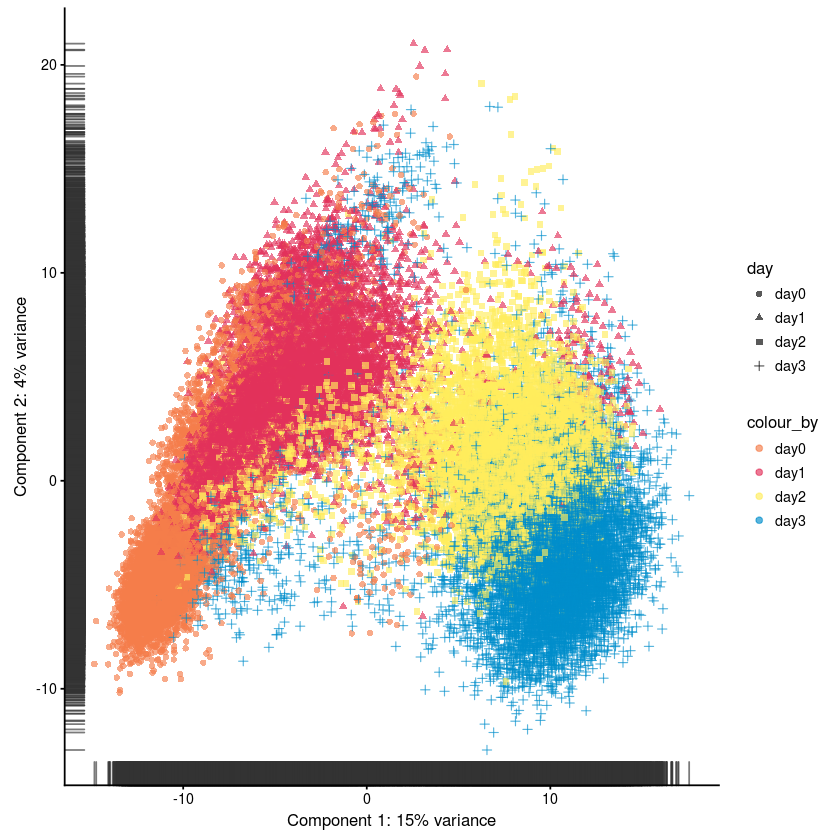

In [42]:
# library(ggthemes)
plotPCA(sce_filt, colour_by = "day", shape_by = "day", ncomponents = 2) + 
        scale_colour_canva(palette = "Candy coated brights")

In [135]:
mean(table(sce_filt$donor, sce_filt$day)[table(sce_filt$donor, sce_filt$day)!=0])

[1] 82.22022

In [137]:
min(sce_filt[, !(is.na(colData(sce_filt)$mean_cxcr4_norm_sorted)) & 
             colData(sce_filt)$mean_cxcr4_norm_sorted > 0 &
            sce_filt$day == "day3"])

ERROR: Error in min(sce_filt[, !(is.na(colData(sce_filt)$mean_cxcr4_norm_sorted)) & : invalid 'type' (S4) of argument


In [54]:
donor.counts = colSums(table(sce_filt$experiment, sce_filt$donor)>0)
length(donor.counts)
length(donor.counts[donor.counts>1])
donor.counts[donor.counts>2]

[1] 130

[1] 35

guss iisa 
   3    3

In [56]:
names(donor.counts[donor.counts>1])

[1] "aowh" "bezi" "datg" "fafq" "fawm" "ffdm" "guss" "guyj" "hayt" "heth"
[11] "iisa" "iudw" "joxm" "kajh" "lepk" "letw" "naju" "nocf" "nudd" "oebj"
[21] "paab" "pelm" "poih" "pulk" "rutc" "sehl" "seru" "sojd" "tout" "vass"
[31] "wahn" "wibj" "wigw" "wuye" "zapk"

In [71]:
mysce = sce[,sce$day == "day3"]
mat = table(mysce$donor, mysce$experiment) 
ord = which(table(mysce$donor, mysce$experiment) > 5, arr.ind = T)
l = c()
for (i in 1:dim(ord)[1]){
    l[i] <- paste0(rownames(mat)[ord[i,1]],"-",colnames(mat)[ord[i,2]])
}
l3 = l

In [72]:
mysce = sce[,sce$day == "day2"]
mat = table(mysce$donor, mysce$experiment) 
ord = which(table(mysce$donor, mysce$experiment) > 5, arr.ind = T)
l = c()
for (i in 1:dim(ord)[1]){
    l[i] <- paste0(rownames(mat)[ord[i,1]],"-",colnames(mat)[ord[i,2]])
}
l2 = l

In [119]:
get_cxcr4_byexpt_day2 <- function(sceset, l){
    n = length(l)
    cxcr4_2 <- matrix(0,nrow = 1, ncol = n)
    for (i in 1:n){
        don = gsub("*-.*","",l[i])
        expt = gsub(".*-","",l[i])
        sc = sceset[,sceset$donor == don & sceset$experiment == expt & sceset$day == "day2"]
        sc1 = sc[, !(is.na(colData(sc)$mean_cxcr4_norm_sorted))]
        sc2 = sc[, !(is.na(colData(sc)$mean_cxcr4_norm_sorted)) & colData(sc)$mean_cxcr4_norm_sorted > 0]
        cxcr4_2[,i] <- dim(sc2)[2]/dim(sc1)[2]
    }
    rownames(cxcr4_2) = "day3_pct_cxcr4pos"
    colnames(cxcr4_2) = l
    cxcr4_2
}

In [64]:
get_cxcr4_byexpt_day3 <- function(sceset, l){
    n = length(l)
    cxcr4_3 <- matrix(0,nrow = 1, ncol = n)
    for (i in 1:n){
        don = gsub("*-.*","",l[i])
        expt = gsub(".*-","",l[i])
        sc = sceset[,sceset$donor == don & sceset$experiment == expt & sceset$day == "day3"]
        sc1 = sc[, !(is.na(colData(sc)$mean_cxcr4_norm_sorted))]
        sc2 = sc[, !(is.na(colData(sc)$mean_cxcr4_norm_sorted)) & colData(sc)$mean_cxcr4_norm_sorted > 0]
        cxcr4_3[,i] <- dim(sc2)[2]/dim(sc1)[2]
    }
    rownames(cxcr4_3) = "day3_pct_cxcr4pos"
    colnames(cxcr4_3) = l
    cxcr4_3
}

In [116]:
diff_goodness = get_cxcr4_byexpt_day3(sce, l3)
diff_goodness = diff_goodness[,order(diff_goodness, decreasing = T)]

In [120]:
diff_speed = get_cxcr4_byexpt_day2(sce, l2)
diff_speed = diff_speed[,order(diff_speed, decreasing = T)]

In [122]:
# names(donor.counts3[donor.counts3>1])
names(donor.counts2[donor.counts2>1])

[1] "datg" "fawm" "guss" "iisa" "lepk" "naju" "nocf" "nudd" "oebj" "poih"
[11] "wigw"

In [126]:
unique(sce2$experiment)

[1] "expt_21" "expt_22" "expt_24" "expt_31" "expt_36" "expt_37" "expt_38"
 [8] "expt_39" "expt_40" "expt_41" "expt_42" "expt_43" "expt_44" "expt_45"
[15] "expt_28" "expt_29" "expt_32" "expt_33" "expt_34" "expt_35"

In [129]:
diff_speed[grep("expt_21", names(diff_speed))]
diff_speed[grep("expt_22", names(diff_speed))]
diff_speed[grep("expt_24", names(diff_speed))]
diff_speed[grep("expt_28", names(diff_speed))]
diff_speed[grep("expt_29", names(diff_speed))]
diff_speed[grep("expt_31", names(diff_speed))]
diff_speed[grep("expt_32", names(diff_speed))]
diff_speed[grep("expt_33", names(diff_speed))]
diff_speed[grep("expt_34", names(diff_speed))]
diff_speed[grep("expt_35", names(diff_speed))]
diff_speed[grep("expt_36", names(diff_speed))]
diff_speed[grep("expt_37", names(diff_speed))]
diff_speed[grep("expt_38", names(diff_speed))]
diff_speed[grep("expt_39", names(diff_speed))]
diff_speed[grep("expt_40", names(diff_speed))]
diff_speed[grep("expt_41", names(diff_speed))]
diff_speed[grep("expt_42", names(diff_speed))]
diff_speed[grep("expt_43", names(diff_speed))]
diff_speed[grep("expt_44", names(diff_speed))]
diff_speed[grep("expt_45", names(diff_speed))]

oebj-expt_21 koqx-expt_21 dixh-expt_21 naju-expt_21 fawm-expt_21 
  0.54545455   0.26315789   0.16438356   0.14285714   0.07142857

oebj-expt_22 eoxi-expt_22 iudw-expt_22 oojs-expt_22 fawm-expt_22 pulk-expt_22 
  0.17647059   0.07692308   0.05882353   0.05555556   0.03225806   0.03125000

walu-expt_24 iisa-expt_24 guyj-expt_24 babz-expt_24 oikd-expt_24 
  0.43478261   0.30188679   0.25714286   0.14634146   0.07142857

miaj-expt_28 iiyk-expt_28 letw-expt_28 rutc-expt_28 poih-expt_28 laey-expt_28 
   0.5000000    0.3333333    0.2929293    0.2833333    0.2635659    0.2500000

naah-expt_29 aowh-expt_29 poih-expt_29 keui-expt_29 meue-expt_29 vils-expt_29 
   0.3103448    0.2903226    0.1893688    0.1538462    0.1481481    0.1333333

lepk-expt_31 veku-expt_31 ueah-expt_31 cicb-expt_31 cuhk-expt_31 hegp-expt_31 
   0.5384615    0.4375000    0.4047619    0.3857143    0.2972973    0.2800000

lepk-expt_32 nocf-expt_32 mita-expt_32 oibg-expt_32 guss-expt_32 
 0.111111111  0.055555556  0.051282051  0.009803922  0.000000000

datg-expt_33 paab-expt_33 qorq-expt_33 nudd-expt_33 feec-expt_33 guss-expt_33 
  0.02083333   0.01562500   0.01204819   0.01041667   0.00000000   0.00000000

bokz-expt_34 datg-expt_34 guss-expt_34 nudd-expt_34 sehl-expt_34 
           0            0            0            0            0

wahn-expt_35 zagm-expt_35 nufh-expt_35 nocf-expt_35 wigw-expt_35 fejf-expt_35 
  0.18750000   0.10000000   0.09375000   0.06382979   0.03703704   0.00000000

lise-expt_36 kajh-expt_36 puie-expt_36 qoog-expt_36 naju-expt_36 eiwy-expt_36 
  0.20512821   0.06382979   0.05825243   0.04761905   0.04347826   0.00000000

zerv-expt_37 iezw-expt_37 uenn-expt_37 kolf-expt_37 seru-expt_37 wegi-expt_37 
   0.5588235    0.5510204    0.5000000    0.4242424    0.1785714    0.0000000

sojd-expt_38 yemz-expt_38 tolg-expt_38 qaqx-expt_38 vass-expt_38 rayr-expt_38 
  0.23853211   0.12500000   0.12068966   0.05142857   0.04494382   0.02857143

wuye-expt_39 joxm-expt_39 iisa-expt_39 heth-expt_39 kucg-expt_39 
  0.15277778   0.13249211   0.11111111   0.09090909   0.06896552

pelm-expt_40 kefb-expt_40 zapk-expt_40 tout-expt_40 nosn-expt_40 
   0.2681564    0.1944444    0.1721854    0.1718750    0.1126761

eipl-expt_41 pahc-expt_41 hoik-expt_41 hayt-expt_41 yoch-expt_41 xojn-expt_41 
  0.25757576   0.12280702   0.11267606   0.10280374   0.06666667   0.04761905

fiaj-expt_42 bima-expt_42 vuna-expt_42 giju-expt_42 qihv-expt_42 zihe-expt_42 
 0.066666667  0.022727273  0.012820513  0.004484305  0.000000000  0.000000000

kuxp-expt_43 melw-expt_43 qunz-expt_43 aoxv-expt_43 yelp-expt_43 eesb-expt_43 
  0.16091954   0.11392405   0.11235955   0.08333333   0.05479452   0.04854369

toco-expt_44 uilk-expt_44 pipw-expt_44 jejf-expt_44 juuy-expt_44 qehq-expt_44 
  0.16666667   0.13636364   0.13333333   0.09000000   0.06722689   0.02542373

ciwj-expt_45 tert-expt_45 hecn-expt_45 liqa-expt_45 hajc-expt_45 kuco-expt_45 
  0.22857143   0.09523810   0.09392265   0.08695652   0.07407407   0.06730769

In [127]:
# diff_speed[grep("datg", names(diff_speed))]
# diff_speed[grep("fawm", names(diff_speed))]
# diff_speed[grep("guss", names(diff_speed))]
# diff_speed[grep("iisa", names(diff_speed))]
# diff_speed[grep("lepk", names(diff_speed))]
# diff_speed[grep("naju", names(diff_speed))]
# diff_speed[grep("nocf", names(diff_speed))]
# diff_speed[grep("nudd", names(diff_speed))]
# diff_speed[grep("oebj", names(diff_speed))]
# diff_speed[grep("poih", names(diff_speed))]
# diff_speed[grep("wigw", names(diff_speed))]

In [130]:
unique(sce3$experiment)

[1] "expt_03" "expt_10" "expt_21" "expt_22" "expt_23" "expt_27" "expt_30"
 [8] "expt_31" "expt_36" "expt_38" "expt_39" "expt_40" "expt_41" "expt_42"
[15] "expt_43" "expt_44" "expt_45" "expt_28" "expt_29" "expt_32" "expt_33"
[22] "expt_34" "expt_35"

In [131]:
diff_goodness[grep("expt_03", names(diff_goodness))]
diff_goodness[grep("expt_10", names(diff_goodness))]
diff_goodness[grep("expt_21", names(diff_goodness))]
diff_goodness[grep("expt_22", names(diff_goodness))]
diff_goodness[grep("expt_23", names(diff_goodness))]
diff_goodness[grep("expt_27", names(diff_goodness))]
diff_goodness[grep("expt_28", names(diff_goodness))]
diff_goodness[grep("expt_29", names(diff_goodness))]
diff_goodness[grep("expt_30", names(diff_goodness))]
diff_goodness[grep("expt_31", names(diff_goodness))]
diff_goodness[grep("expt_32", names(diff_goodness))]
diff_goodness[grep("expt_33", names(diff_goodness))]
diff_goodness[grep("expt_34", names(diff_goodness))]
diff_goodness[grep("expt_35", names(diff_goodness))]
diff_goodness[grep("expt_36", names(diff_goodness))]
diff_goodness[grep("expt_38", names(diff_goodness))]
diff_goodness[grep("expt_39", names(diff_goodness))]
diff_goodness[grep("expt_40", names(diff_goodness))]
diff_goodness[grep("expt_41", names(diff_goodness))]
diff_goodness[grep("expt_42", names(diff_goodness))]
diff_goodness[grep("expt_43", names(diff_goodness))]
diff_goodness[grep("expt_44", names(diff_goodness))]
diff_goodness[grep("expt_45", names(diff_goodness))]

ffdm-expt_03 bubh-expt_03 jufd-expt_03 oaaz-expt_03 
   0.7777778    0.5714286    0.4000000    0.1250000

sojd-expt_10 wopl-expt_10 sebz-expt_10 fafq-expt_10 garx-expt_10 hayt-expt_10 
   0.8387097    0.7037037    0.6666667    0.6000000    0.4625000    0.4285714

naju-expt_21 koqx-expt_21 oebj-expt_21 dixh-expt_21 fawm-expt_21 
   1.0000000    0.6875000    0.5714286    0.2738095    0.2500000

oojs-expt_22 iudw-expt_22 oebj-expt_22 pulk-expt_22 eoxi-expt_22 fawm-expt_22 
   0.6250000    0.5833333    0.4000000    0.2758621    0.2500000    0.2000000

qayj-expt_23 guyj-expt_23 seru-expt_23 pulk-expt_23 
   0.3333333    0.3063063    0.2608696    0.1754386

sohd-expt_27 vazt-expt_27 quls-expt_27 oilg-expt_27 ffdm-expt_27 letw-expt_27 
   0.8750000    0.7741935    0.7272727    0.7142857    0.6875000    0.6428571 
rutc-expt_27 
   0.5882353

iiyk-expt_28 laey-expt_28 rutc-expt_28 poih-expt_28 letw-expt_28 miaj-expt_28 
   1.0000000    1.0000000    0.9130435    0.8536585    0.8382353    0.7857143

poih-expt_29 meue-expt_29 aowh-expt_29 vils-expt_29 keui-expt_29 naah-expt_29 
   0.8486842    0.8301887    0.8023256    0.7818182    0.7631579    0.7615385

sehl-expt_30 wahn-expt_30 oicx-expt_30 wibj-expt_30 aowh-expt_30 
   0.7368421    0.6500000    0.5416667    0.4545455    0.4444444

ueah-expt_31 cicb-expt_31 hegp-expt_31 cuhk-expt_31 veku-expt_31 
   0.8947368    0.8846154    0.8750000    0.8518519    0.8000000

mita-expt_32 nocf-expt_32 guss-expt_32 oibg-expt_32 
   0.4594595    0.4545455    0.4084507    0.2714286

nudd-expt_33 datg-expt_33 paab-expt_33 qorq-expt_33 feec-expt_33 guss-expt_33 
   0.4722222    0.4000000    0.3437500    0.3380282    0.3333333    0.3281250

bokz-expt_34 datg-expt_34 guss-expt_34 nudd-expt_34 sehl-expt_34 
           0            0            0            0            0

wahn-expt_35 fejf-expt_35 nocf-expt_35 wigw-expt_35 zagm-expt_35 nufh-expt_35 
   0.7777778    0.7272727    0.6901408    0.6666667    0.5263158    0.5161290

eiwy-expt_36 puie-expt_36 qoog-expt_36 lise-expt_36 kajh-expt_36 naju-expt_36 
   0.4800000    0.4350877    0.4062500    0.3866667    0.3148148    0.2545455

yemz-expt_38 tolg-expt_38 sojd-expt_38 rayr-expt_38 vass-expt_38 qaqx-expt_38 
   0.9090909    0.8928571    0.8333333    0.7777778    0.6666667    0.6538462

joxm-expt_39 wuye-expt_39 iisa-expt_39 
   0.7600000    0.4705882    0.3333333

nosn-expt_40 kefb-expt_40 zapk-expt_40 tout-expt_40 pelm-expt_40 
   0.6226415    0.5714286    0.5390625    0.5000000    0.4936709

hoik-expt_41 hayt-expt_41 eipl-expt_41 xojn-expt_41 pahc-expt_41 yoch-expt_41 
   0.5106383    0.4629630    0.4561404    0.4251497    0.4220183    0.4210526

fiaj-expt_42 bima-expt_42 zihe-expt_42 vuna-expt_42 giju-expt_42 qihv-expt_42 
   0.8235294    0.6000000    0.6000000    0.5657895    0.5430464    0.4000000

qunz-expt_43 kuxp-expt_43 aoxv-expt_43 melw-expt_43 yelp-expt_43 eesb-expt_43 
   0.5573770    0.5238095    0.5211268    0.4625000    0.4606061    0.3897436

uilk-expt_44 toco-expt_44 qehq-expt_44 pipw-expt_44 jejf-expt_44 juuy-expt_44 
   0.4545455    0.3666667    0.3656716    0.3203883    0.3000000    0.1781818

hajc-expt_45 liqa-expt_45 hecn-expt_45 kuco-expt_45 tert-expt_45 ciwj-expt_45 
   0.7200000    0.7142857    0.6907895    0.6792453    0.6300000    0.5897436

In [128]:
# diff_goodness[grep("aowh", names(diff_goodness))]
# diff_goodness[grep("datg", names(diff_goodness))]
# diff_goodness[grep("fawm", names(diff_goodness))]
# diff_goodness[grep("ffdm", names(diff_goodness))]
# diff_goodness[grep("guss", names(diff_goodness))]
# diff_goodness[grep("hayt", names(diff_goodness))]
# diff_goodness[grep("lepk", names(diff_goodness))]
# diff_goodness[grep("letw", names(diff_goodness))]
# diff_goodness[grep("naju", names(diff_goodness))]
# diff_goodness[grep("nocf", names(diff_goodness))]
# diff_goodness[grep("nudd", names(diff_goodness))]
# diff_goodness[grep("oebj", names(diff_goodness))]
# diff_goodness[grep("poih", names(diff_goodness))]
# diff_goodness[grep("pulk", names(diff_goodness))]
# diff_goodness[grep("rutc", names(diff_goodness))]
# diff_goodness[grep("sehl", names(diff_goodness))]
# diff_goodness[grep("sojd", names(diff_goodness))]
# diff_goodness[grep("wahn", names(diff_goodness))]
# diff_goodness[grep("wigw", names(diff_goodness))]

In [105]:
sce3 = sce_filt[,sce_filt$day == 'day3']
donor.counts3 = colSums(table(sce3$experiment, sce3$donor)>0)

In [121]:
sce2 = sce_filt[,sce_filt$day == 'day2']
donor.counts2 = colSums(table(sce2$experiment, sce2$donor)>0)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


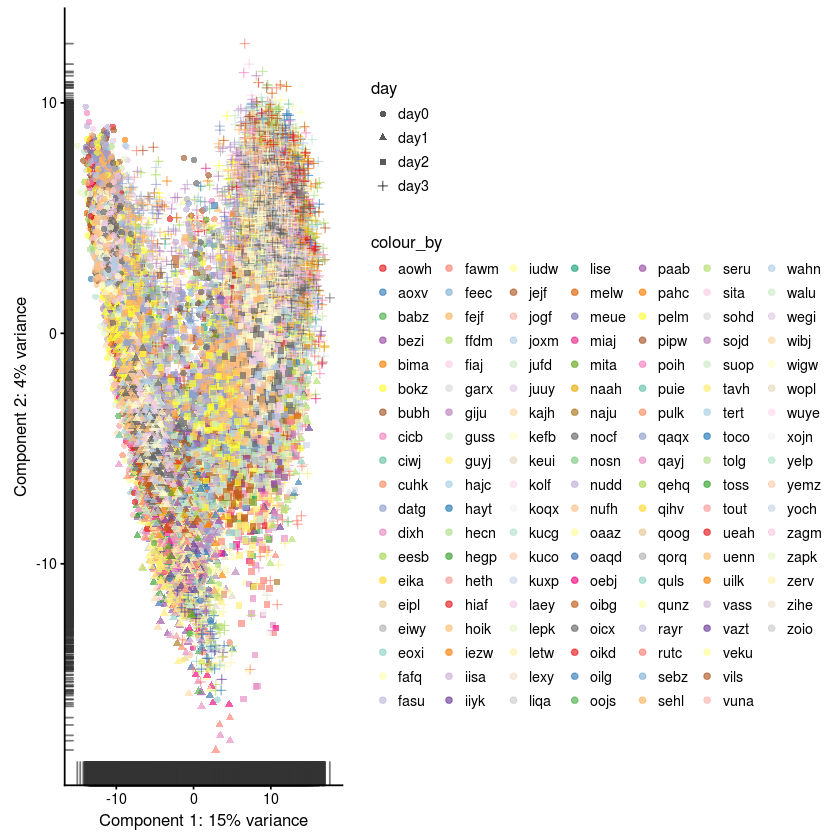

In [47]:
plotPCA(sce_filt, colour_by = "donor", shape_by = "day",
                   ncomponents = 2) +
                   scale_colour_manual(values = c(col_list,col_list)) 
# + theme(legend.position = "none")

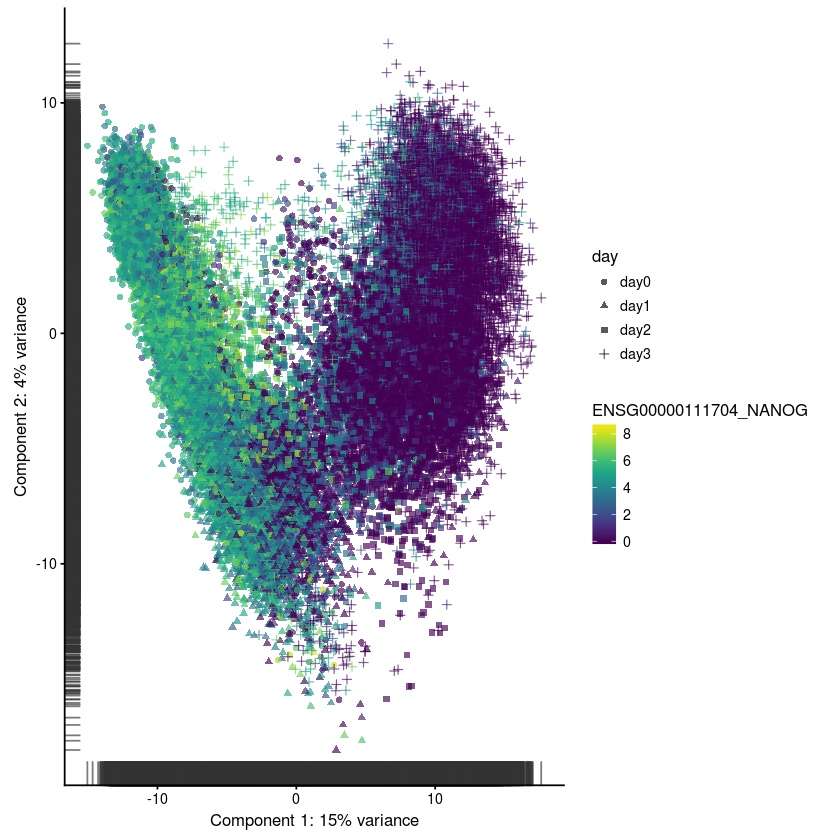

In [46]:
plotPCA(sce_filt, colour_by = "ENSG00000111704_NANOG", shape_by = "day",
                   ncomponents = 2)

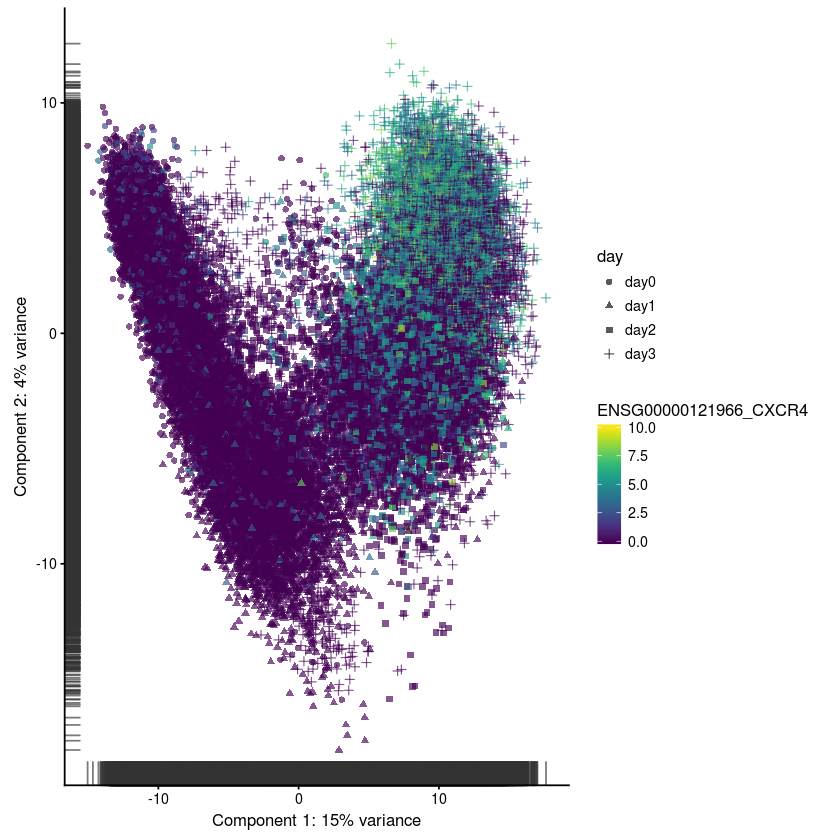

In [39]:
plotPCA(sce_filt, colour_by = "ENSG00000121966_CXCR4", shape_by = "day",
                   ncomponents = 2)

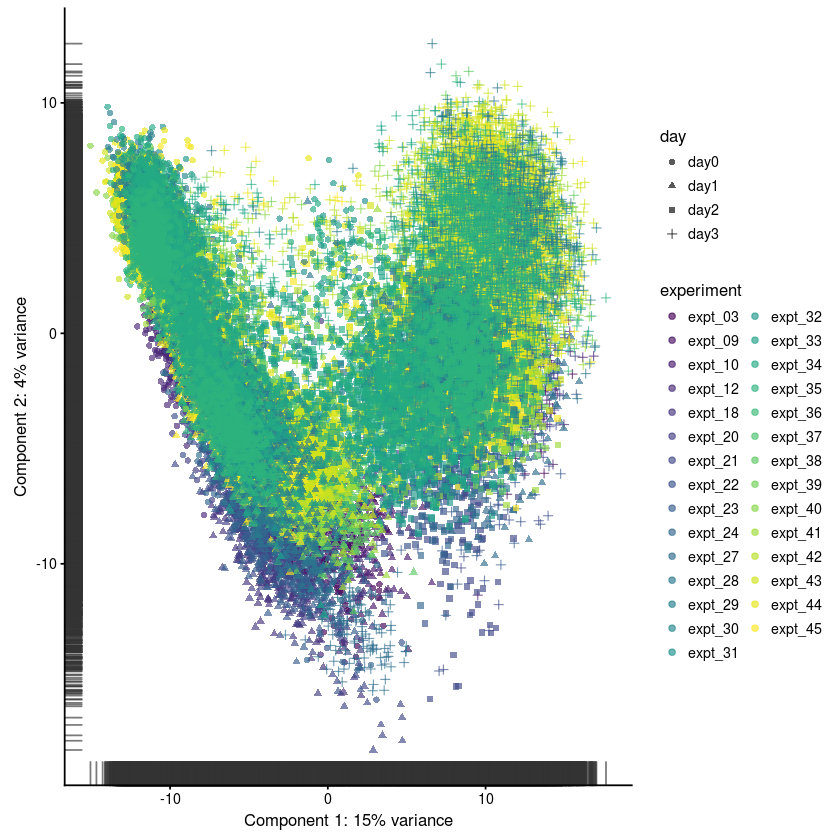

In [38]:
plotPCA(sce_filt, colour_by = "experiment", shape_by = "day",
                   ncomponents = 2)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


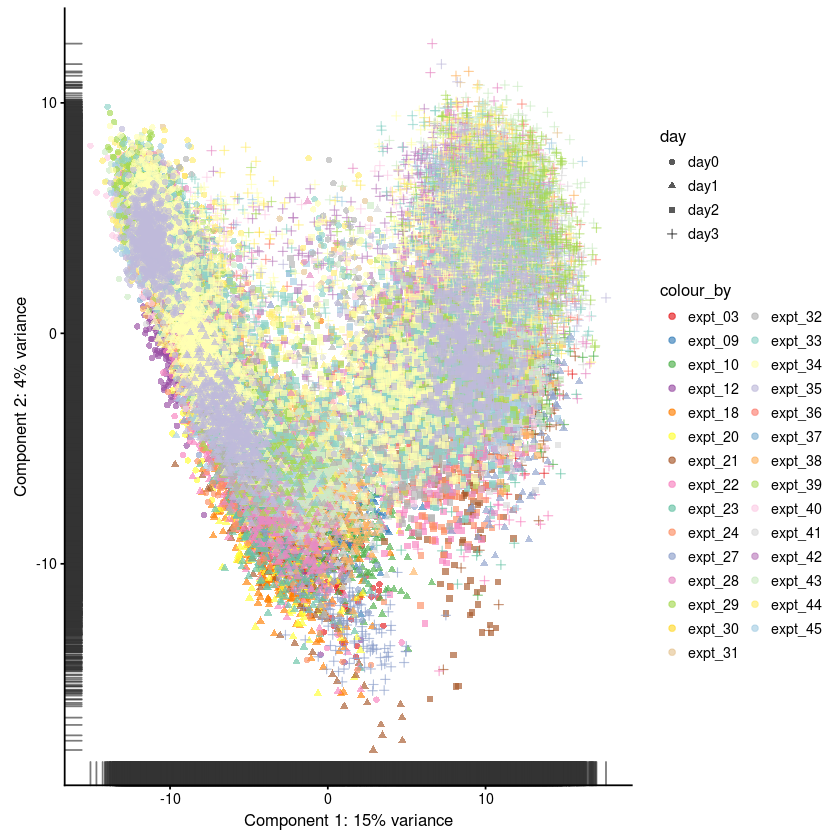

In [37]:
plotPCA(sce_filt, colour_by = "experiment", shape_by = "day",
                   ncomponents = 2) +
                   scale_colour_manual(values = col_list)

In [34]:
library(ggthemes)

In [35]:
#canva_palettes

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


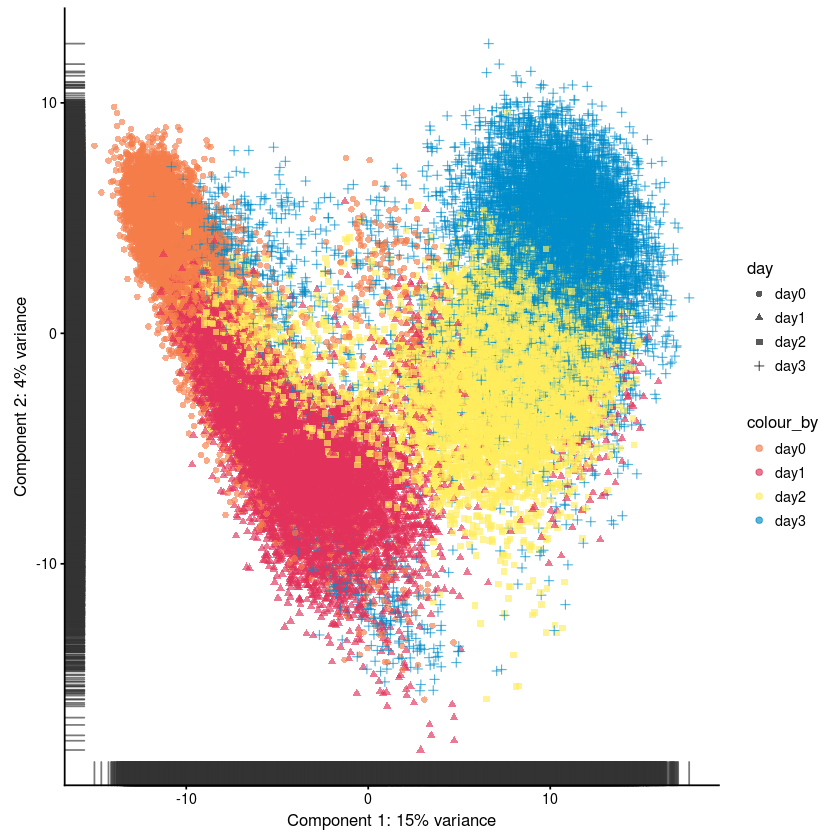

In [37]:
plotPCA(sce_filt, colour_by = "day", shape_by = "day", ncomponents = 2) + 
        scale_colour_canva(palette = "Candy coated brights")

In [182]:
library(scran)
sce_filt <- normalize(sce_filt)
design <- model.matrix(~experiment, data = colData(sce_filt))
alt.fit <- trendVar(sce_filt, design = design, use.spikes = FALSE)
alt.decomp <- decomposeVar(sce_filt, alt.fit)

Loading required package: BiocParallel


In [186]:
top.hvgs <- order(alt.decomp$bio, decreasing = TRUE)
hvgs <- rownames(alt.decomp[alt.decomp$FDR < 0.01,])
sce_hvg <- sce_filt[rownames(sce_filt) %in% c(hvgs, diff_genes),]

In [189]:
dim(sce_hvg)

[1]  4547 32143

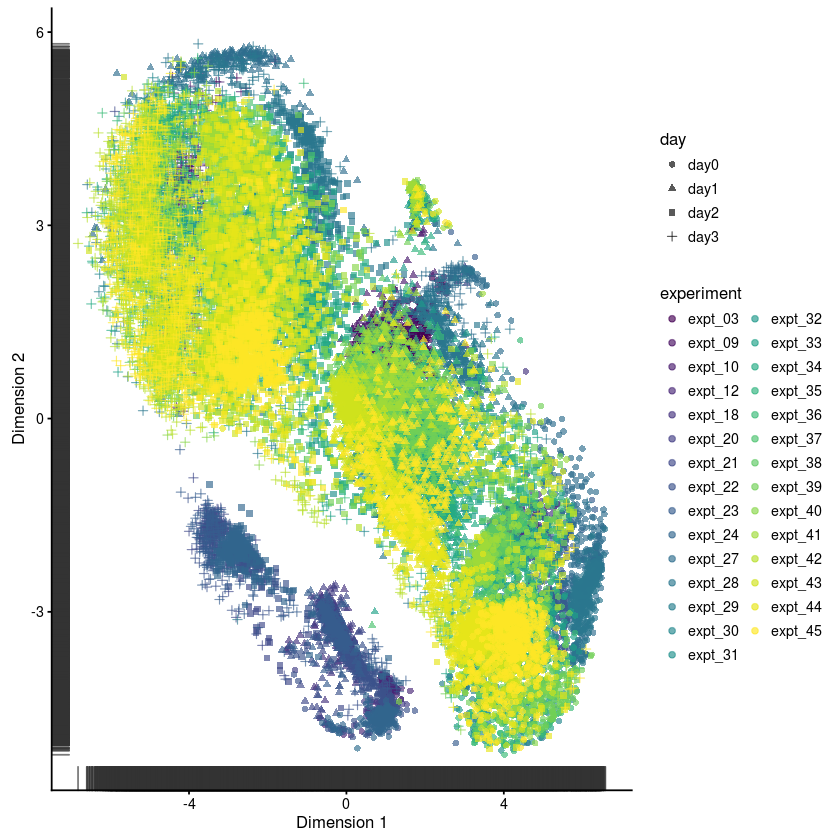

In [188]:
plotTSNE(sce_hvg, colour_by = "experiment", shape_by = "day")

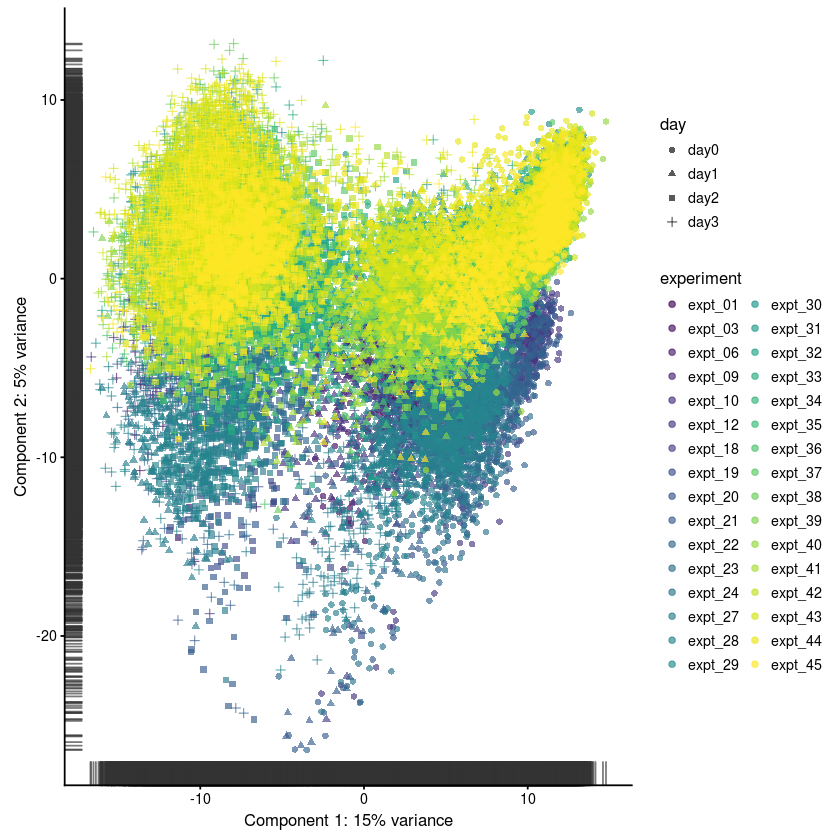

In [120]:
sce <- plotPCA(sce, colour_by = "experiment", shape_by = "day",
                   return_SCE = TRUE, ncomponents = 2, draw_plot = TRUE)

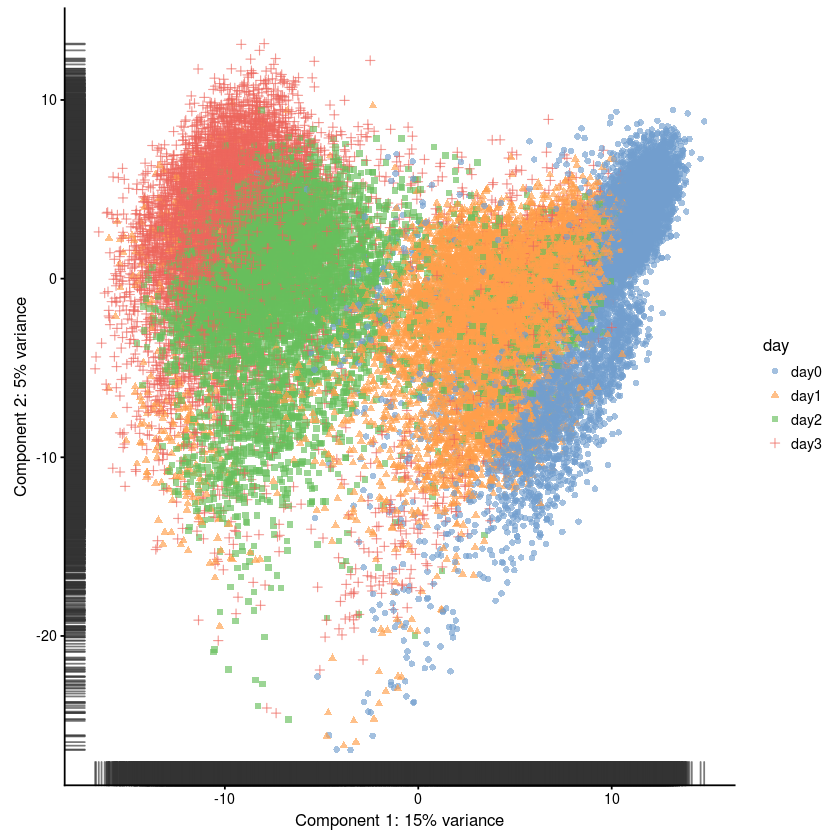

In [121]:
sce <- plotPCA(sce, colour_by = "day", shape_by = "day",
                   return_SCE = TRUE, ncomponents = 2, draw_plot = TRUE)

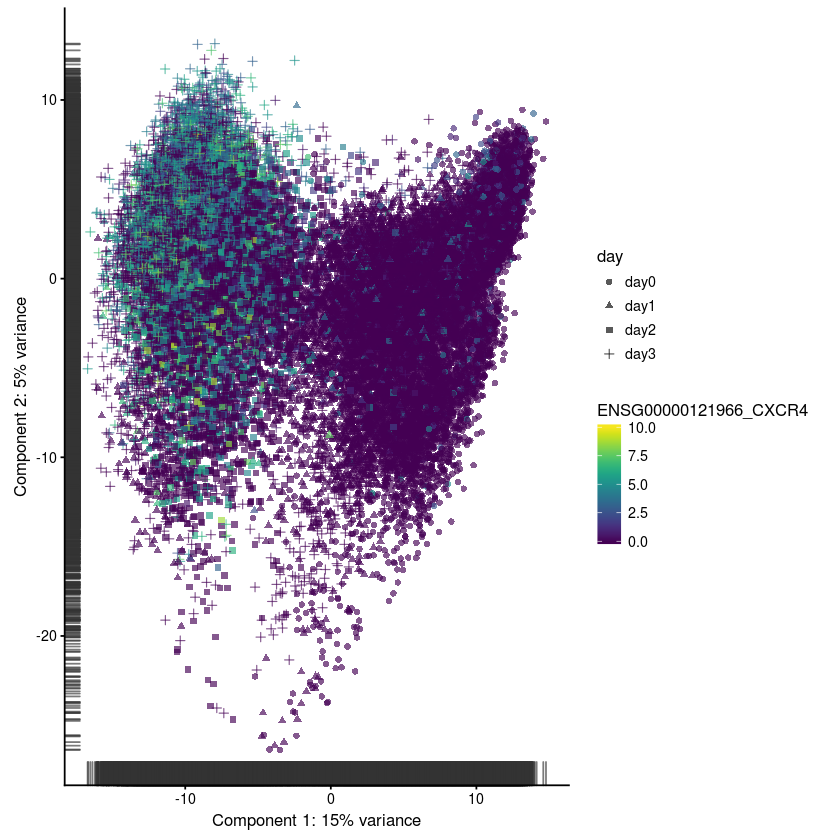

In [139]:
sce <- plotPCA(sce, colour_by = "ENSG00000121966_CXCR4", shape_by = "day",
                   return_SCE = TRUE, ncomponents = 2, draw_plot = TRUE)

In [9]:
table(sce1$experiment, sce1$day)

         
          day0 day1 day2 day3
  expt_01    0    0    0   73
  expt_03  283    0    0   47
  expt_06    0   52   14   17
  expt_09    0  285    0    0
  expt_10    0  206    0  295
  expt_12  280    0    0    0
  expt_18  266  325    0    0
  expt_19   56   10   76   62
  expt_20   48  154    0    0
  expt_21  173  157  157  201
  expt_22  211  218  176  157
  expt_23  311  246    0  212
  expt_24  164    0  224    0
  expt_27  363  210   19  178
  expt_28  361  357  357  179

In [39]:
table(sce2$experiment, sce2$day)

         
          day0 day1 day2 day3
  expt_29  252  251  347  256
  expt_30  164  155   53  148
  expt_31  165  153  226  122
  expt_32  259  328  214  149
  expt_33  640  344  468  617
  expt_34  339  337  324  209
  expt_35  336  309  239  263
  expt_36  281  297  243  541
  expt_37  313  546  285   52
  expt_38  669  642  607  284
  expt_39  605  899  451  243

In [8]:
table(sce3$experiment, sce3$day)

         
          day0 day1 day2 day3
  expt_40  600    0  501  395
  expt_41  318  560  562  627
  expt_42    2    0  487  606
  expt_43  575  469  600  635
  expt_44  548  600  544  614
  expt_45  630  386  571  527

In [24]:
table(sce1$donor, sce1$day)

      
       day0 day1 day2 day3
  babz   28    0   41    0
  bezi    9    0    0    0
  bima    0   19    1    4
  bubh   25    0    0    7
  dixh   45   46   73   84
  eika    9    0    0    8
  eipl    0    0    0    2
  eoxi   22   17   13    8
  fafq    0  192    0  100
  fasu   25   36   17    5
  fawm   94  128  104  172
  ffdm  207   63    7   66
  fuai   12    1    9    4
  garx    0   23    0   80
  guyj  185  105   70  111
  hayt    0   26    0   42
  heth   24    0    0    0
  hiaf    0    4    0    0
  iisa   39   45   53    0
  iiyk   60   49   36   13
  iudw   44   97   34   12
  jogf  102    0    0    0
  joxm    0   87    0    0
  jufd   98    0    0   10
  kajh    8   48    0    0
  kegd    8    2    8    7
  koqx   16   23   19   16
  kuxp    0    0    0   21
  laey    8   13   16   21
  letw  211  179  117  105
  lexy    0   16    3    3
  miaj   38   15   14   13
  naju   29   16    7    6
  oaaz   38    0    0    8
  oapg    0    5    1    1
  oaqd   80   90    0

In [40]:
table(sce2$donor, sce2$day)

      
       day0 day1 day2 day3
  aowh   57   55   51   48
  bezi   13   12    4    3
  bokz   83  109   85   47
  cicb   42   21   75   26
  cuhk   41   47   39   27
  datg  122   86   96   89
  eiwy   25   18   10   25
  feec   75   62   65  108
  fejf   33   18   17   11
  guss  254  192  165  206
  hegp   22   13   25   16
  heth   30   24   11    3
  iezw   30   85   49   18
  iisa   38   55   18    9
  joxm  383  627  317  175
  kajh   47   42   47   57
  keui   23   10   24   21
  kolf   73  104   66    5
  kucg   72   40   29    2
  lepk   35   29   38    5
  lise   62   61   39   77
  meue   74   77   35   47
  mita   35   56   24   21
  naah   32   31   32   60
  naju   25   29   23   57
  nocf   83   97   65   78
  nudd  196  120  175  164
  nufh   64   37   33   31
  oibg  105  150  107   82
  oicx   34   42   17   48
  paab  118   47   70   57
  poih   62   60  180   65
  puie  100  125  103  293
  qaqx  101  197  175  104
  qoog   22   22   21   32
  qorq  152   85  103

In [25]:
table(sce3$donor, sce3$day)

      
       day0 day1 day2 day3
  aoxv   68   58   96   71
  bima    0    0   44   31
  ciwj   40   27   35   39
  eesb   66  106  103  195
  eipl   99  189  198   57
  fiaj    0    0   75   37
  giju    1    0  223  314
  hajc  130   51   54   25
  hayt   41   65  107  162
  hecn  163  117  181  152
  hoik   32   99   71   94
  jejf  107  105  100   50
  juuy  132  114  119  275
  kefb   67    0   36   14
  kuco   95   61  104  106
  kuxp   84   65   87   63
  liqa  110   72   92  105
  melw  101   57   79   80
  nosn   73    0   71   53
  pahc   61   74   57  109
  pelm  173    0  179  158
  pipw  111  120  105  103
  qehq  115  141  118  134
  qihv    1    0   53   66
  qunz   82   61   89   61
  tert   92   58  105  100
  toco   29   50   36   30
  tout  119    0   64   42
  uilk   54   70   66   22
  vuna    0    0   78  146
  xojn   27   55   84  167
  yelp  174  122  146  165
  yoch   58   78   45   38
  zapk  168    0  151  128
  zihe    0    0   14   12

In [37]:
donors = c(sce1$donor, sce2$donor, sce3$donor)
length(unique(donors))
unique(donors)

[1] 137

[1] "podx" "eipl" "pahc" "kuxp" "xugn" "eika" "bezi" "oaaz" "ffdm" "bubh"
 [11] "jufd" "pamv" "oapg" "lexy" "rozh" "bima" "joxm" "fafq" "wuye" "iisa"
 [21] "hiaf" "wopl" "sebz" "hayt" "garx" "sojd" "zapk" "wibj" "jogf" "pelm"
 [31] "vass" "heth" "paab" "toss" "sita" "zoio" "oaqd" "kegd" "xojn" "fasu"
 [41] "zerv" "fuai" "kajh" "tout" "iudw" "tavh" "fawm" "dixh" "koqx" "oebj"
 [51] "naju" "wigw" "oojs" "pulk" "eoxi" "seru" "qayj" "guyj" "oikd" "walu"
 [61] "babz" "quls" "sohd" "letw" "oilg" "rutc" "vazt" "poih" "iiyk" "laey"
 [71] "miaj" "vils" "aowh" "naah" "meue" "keui" "oicx" "sehl" "wahn" "suop"
 [81] "cuhk" "hegp" "cicb" "lepk" "veku" "ueah" "oibg" "guss" "mita" "nocf"
 [91] "datg" "qorq" "feec" "nudd" "bokz" "zagm" "fejf" "nufh" "puie" "lise"
[101] "qoog" "eiwy" "uenn" "iezw" "kolf" "wegi" "tolg" "rayr" "qaqx" "yemz"
[111] "kucg" "nosn" "kefb" "yoch" "hoik" "qihv" "giju" "vuna" "fiaj" "zihe"
[121] "eesb" "yelp" "qunz" "aoxv" "melw" "juuy" "pipw" "jejf" "uilk" "qehq"
[131] "toco" "hajc" "kuco" "hecn" "liqa" "tert" "ciwj"

In [45]:
donors0 = c(sce1[,sce1$day == "day0"]$donor, sce2[,sce2$day == "day0"]$donor, sce3[,sce3$day == "day0"]$donor)
length(unique(donors0))
#unique(donors0)

[1] 122

In [46]:
donors1 = c(sce1[,sce1$day == "day1"]$donor, sce2[,sce2$day == "day1"]$donor, sce3[,sce3$day == "day1"]$donor)
length(unique(donors1))
#unique(donors1)

[1] 118

In [47]:
donors2 = c(sce1[,sce1$day == "day2"]$donor, sce2[,sce2$day == "day2"]$donor, sce3[,sce3$day == "day2"]$donor)
length(unique(donors2))
#unique(donors2)

[1] 120

In [48]:
donors3 = c(sce1[,sce1$day == "day3"]$donor, sce2[,sce2$day == "day3"]$donor, sce3[,sce3$day == "day3"]$donor)
length(unique(donors3))
#unique(donors3)

[1] 128

In [56]:
log10(50000)

[1] 4.69897

In [76]:
library(ggthemes)

names(canva_palettes)

names(canva_palettes)[9]
names(canva_palettes)[24]
names(canva_palettes)[26]
names(canva_palettes)[28]
names(canva_palettes)[61]
names(canva_palettes)[66]
names(canva_palettes)[82]
names(canva_palettes)[85]
names(canva_palettes)[97]
names(canva_palettes)[104]
names(canva_palettes)[114]
names(canva_palettes)[115]

options(repr.plot.width = 3, repr.plot.height = 3) 
require("scales")
for (i in 1:length(names(canva_palettes))){
    print(i)
    print(show_col(canva_pal(names(canva_palettes)[i])(4)))
}